# Does the Calmar objective pick a different strategy than Sharpe?

> **Qualified by [NB87](87-research-sharpe-vs-calmar-winner-attribution.ipynb).** The parameter-space
> plateau measured below is real. The profit sitting on it is not broad: NB87 attributes **97.8% of
> this configuration's advantage over NB85's to a single vault, Realist Capital**, which both
> configurations hold and which this one simply sizes larger. The emphasis below on the
> `inverse_variance` to `inverse_vol` flip is also overstated - that change is worth about 3 of the
> 34 percentage points, while `cagr_weight` and dropping one basket slot carry the rest.

[NB85](85-opt-sortino-leg-150k-scared-money-blacklisted.ipynb) ran this search with
`optimise_sharpe` and returned a winner at **22.74% CAGR, -1.74% drawdown, Sharpe 3.057**. A
configuration inside the same top eight returned **49.92% CAGR at Sharpe 2.88** - more than twice
the return for 0.18 of Sharpe.

Backing the implied volatility out of those two rows explains why. Return scaled 2.20x and
volatility scaled 2.33x between them, and the Sortino-to-Sharpe ratio was near identical (1.97
against 2.04). They are not different strategies; they are **the same return distribution at
different exposure**, and Sharpe is scale-invariant so it cannot separate them. It selected the
de-risked one by a hair.

Calmar divides CAGR by the worst drawdown rather than by volatility, so it is not scale-invariant
in the same way. On those two configurations it ranks them the other way round: **13.07 against
17.60**, favouring the higher-return one, because drawdown scaled only 1.63x while return scaled
2.20x.

This notebook runs the identical search under `optimise_calmar` to see whether that reversal holds
across the whole space, or whether it was an artefact of two hand-picked rows.

**Based on** [85-opt-sortino-leg-150k-scared-money-blacklisted.ipynb](85-opt-sortino-leg-150k-scared-money-blacklisted.ipynb):
identical search space, capital, caps, cadence, fee and blacklist. **The only change is the
objective**, so the two searches are directly comparable - same 18 iterations, same 108 evaluations.

## The reason this chain avoided Calmar, and why it needs testing

NB80 chose Sharpe over Calmar deliberately, and its argument was sound:

> Calmar divides one rounded quantity by another small one: at CAGR ~34% / drawdown ~-6.6% a single
> 1 pp rounding step moves Calmar by 0.81, against a true spread of 0.062 across NB63's top five.

`optimise_calmar` reads `GridSearchResult.get_cagr()` and `get_max_drawdown()`, both of which come
from the QuantStats metrics table that is built with `.round(2)`. As **fractions**. At the drawdown
magnitudes this strategy produces - -1.7% to -4% - that rounds the denominator onto a 1 percentage
point grid, leaving it perhaps four distinct values across the entire search.

That concern is inherited, not measured. This notebook measures it: a diagnostic below compares the
objective's Calmar against Calmar recomputed from each run's own return series, and reports the
rank correlation and how many distinct drawdown values the objective actually saw. If the two
orderings disagree materially, the search steered on noise and its winner should be read as such.

## Search space

Unchanged from NB80 and NB85.

| Parameter | Values |
|---|---|
| `max_assets_in_portfolio` | 6, 7, 8 |
| `inverse_vol_window` | 45, 60, 75, 90 |
| `cagr_weight` | 0.3, 0.5, 0.7, 0.85 |
| `sharpe_lookback_days` (Sortino) | 30, 45, 60, 90, 120 |
| `cagr_lookback_days` | 270, 360 |
| `gate_threshold` | -0.20, -0.16, -0.12, -0.08 |
| `weighting_method` | `inverse_vol`, `inverse_variance` |

**Pinned:** 150,000 capital, 33% max concentration, 33% max vault participation, 2-day cadence,
10 BPS exit fee, $750 softband, Scared Money blacklisted, 2026-01-01 to 2026-07-10.

**3,840 combinations, 18 iterations x batch 6 = 108 evaluations**, Calmar objective.

## What we are looking for

- **Does the winner move up the exposure ladder?** If Calmar is doing what it should, its winner
  should have a materially higher CAGR than NB85's 22.74% and a drawdown that has not grown
  proportionally.
- **Does `cagr_weight` move?** NB85's Sharpe winner used 0.30 - a score that is 70% Sortino, which
  ranks vaults by smoothness and selects the low-volatility cohort NB84 measured at +0.5% mean
  return.
- **Is the objective's own signal usable?** See the rounding diagnostic.
- **Do the structural axes hold?** `cagr_lookback_days` = 360 took 100% of NB85's top 15.

## Key new insights and what did we learn from this experiment?

### The Calmar objective dominates the Sharpe objective on its own metric

| | NB85 - Sharpe objective | NB86 - Calmar objective |
|---|---|---|
| Winner | 360 / 0.30 / -0.16 / 75 / **8** / 45 / **`inverse_variance`** | 360 / **0.50** / -0.20 / 75 / **7** / 45 / **`inverse_vol`** |
| CAGR | 22.74% | **57.04%** |
| Max drawdown | -1.74% | -2.74% |
| **Sharpe** | **3.057** | **3.070** |
| Sortino | 6.04 | **7.82** |
| Calmar | 13.07 | **20.80** |
| Trades | 550 | 517 |

The Calmar search found a configuration with **2.5x the return, a higher Sortino, a higher Calmar,
fewer trades - and a higher Sharpe than the Sharpe search's own winner.**

That last point is the one that matters. Both searches ran 108 evaluations over the identical
3,840-combination space with the same seed budget; the only difference was the objective. The
Sharpe-guided Gaussian Process **did not find its own optimum**, and the Calmar-guided one walked
through it on the way somewhere else. A 3% sample of the space is small enough that where the
objective steers the search matters more than what it ultimately scores.

The drawdown cost of that is 1 percentage point, -1.74% to -2.74%, for 34 points of CAGR.

### The sizing rule flips, and it is the rule NB77 and NB84 warned about

| Axis | NB85 (Sharpe) | NB86 (Calmar) |
|---|---|---|
| `weighting_method` | `inverse_variance` (73%) | **`inverse_vol` (87%)** |
| `cagr_weight` | 0.30 (33%, four values) | **0.50 (93%)** |
| `max_assets_in_portfolio` | 8 (80%) | **7 (87%)** |
| `sharpe_lookback_days` | 45 (80%) | **45 (100%)** |
| `cagr_lookback_days` | 360 (100%) | **360 (100%)** |
| `inverse_vol_window` | 75 (67%) | 75 (40%) |
| `gate_threshold` | -0.16 (53%) | -0.20 (27%) |

`inverse_variance` weights by the reciprocal of *variance*, so it concentrates hardest into the
lowest-volatility names. NB77 predicted that would tilt the book toward the losing cohort; NB84
measured it directly, finding the largest-entry quartile returned **+0.5%** against **+6.0%** for
the second quartile. The Sharpe objective liked `inverse_variance` precisely because low volatility
flatters a volatility-denominated ratio. Calmar, which is denominated in drawdown, drops it in 87%
of its top 15.

`cagr_weight` also settles: 0.50 with 93% agreement, against NB85's 0.30 spread over four values.
An even blend of the CAGR and Sortino legs is what a drawdown-aware objective wants - which is, as
it happens, exactly the 0.5/0.5 score this chain has used for vault selection since NB19.

### This is a plateau, not a peak

The top seven configurations share **five of seven parameters** - 360-day lookback, 0.50 CAGR
weight, 75 or 60-day volatility window, 7 vaults, 45-day Sortino window, `inverse_vol` - and vary
only in `gate_threshold` and `inverse_vol_window`:

| CAGR | Max DD | Sharpe | Calmar | Gate | Vol window |
|---:|---:|---:|---:|---:|---:|
| 57.04% | -2.74% | 3.07 | 20.80 | -0.20 | 75 |
| 55.06% | -2.77% | 3.01 | 19.89 | -0.16 | 75 |
| 54.27% | -2.77% | 3.00 | 19.61 | -0.12 | 75 |
| 51.51% | -2.77% | 2.95 | 18.59 | -0.12 | 60 |
| 50.01% | -2.70% | 3.06 | 18.54 | -0.08 | 75 |
| 57.12% | -3.15% | 3.06 | 18.12 | -0.20 | 90 |
| 53.71% | -2.98% | 3.01 | 18.05 | -0.20 | 60 |

**The gate spans all four searched values across these rows and CAGR only moves from 50% to 57%.**
Compare NB84's dense sweep of NB80's 73.41% winner, where moving the gate from -0.16 to -0.08 cost
44 percentage points. The `gate_threshold` consensus of 27% is not weakness here - it means the axis
stopped mattering.

This is the first configuration in this chain that looks like a region rather than a point.

### NB80's objection to Calmar does not survive measurement

NB80 rejected Calmar because it divides two rounded quantities. Measured:

| | |
|---|---|
| Distinct max-drawdown values the objective saw | **22** (-0.02 to -0.32) |
| Spearman rank correlation, objective vs recomputed Calmar | **0.998** |
| Objective's winner, ranked on recomputed Calmar | **1 of 106** |

The reasoning was sound but the premise was not: it generalised from NB63's narrow drawdown band,
whereas a real search spans -2% to -32% and gives the denominator ample resolution. Ties inside a
1 pp bucket are broken by the numerator. **The eight Calmar-optimised notebooks in this chain
(NB27, 28, 29, 52, 54, 55, 56, 63) were not steering on noise.**

## Summary of results

**Best configuration: 360-day CAGR lookback, 0.50 CAGR weight, -0.20 gate, 75-day volatility
window, 7 vaults, 45-day Sortino window, `inverse_vol` sizing.** 57.04% CAGR, -2.74% max drawdown,
Sharpe 3.07, Sortino 7.82, Calmar 20.80, 517 trades. No destroyed or stranded capital in any of the
106 completed evaluations; 0 positions on blacklisted vaults.

**Changing the objective changed the answer more than removing a vault did.** Same space, same
budget, same universe - 22.74% to 57.04% CAGR, with Sharpe marginally *better* as well.

**The Sharpe objective was selecting exposure, not strategy**, exactly as the NB85 analysis
suggested. Its preference for `inverse_variance` and a low `cagr_weight` are two expressions of the
same bias toward low-volatility, low-return names.

**The result sits on a plateau**, with five of seven parameters fixed across the top seven
configurations and the gate axis no longer mattering.

**Calmar is a usable objective in this universe**, contrary to the assumption carried since NB63.

## Robustness of results

- **This has not been reproduced standalone.** Every configuration in this chain that mattered was
  re-run outside the optimiser before being believed - NB75, NB76 and NB82 all held exactly. This
  one has not been, and that is the single most valuable next step.
- **108 evaluations of 3,840 combinations is 3% coverage.** The finding that the Sharpe search
  missed its own optimum is itself evidence that a 3% sample is heavily path-dependent, which
  applies equally to this search. A 40-iteration run would test whether the plateau survives.
- **Realist Capital is still in the universe.** NB84 found the 2026-06-20 entry was 21.5% of that
  vault's TVL, and NB83 attributed 39% of NB80's net profit to it. The plateau found here may still
  be resting on capacity the strategy does not have. A pool-cap variant is the test and is not run.
- **The plateau is measured on two axes only.** `gate_threshold` and `inverse_vol_window` vary
  across the top seven; the other five are constant, so their local shape is unknown. NB84's dense
  sweeps would need repeating around this configuration to claim a plateau in the full space.
- **`inverse_vol` winning is a reversal of NB71/NB72**, which found `inverse_variance` better at a
  33% concentration cap. Those notebooks used the Sharpe-family objective, so this is consistent
  rather than contradictory - but it does mean the sizing question has now flipped three times
  across this chain and should not be considered settled.
- **The rounding diagnostic covers this search only.** A search whose configurations clustered in a
  single drawdown bucket would still suffer the effect NB80 described.
- One window, 2026-01-01 to 2026-07-10, on a feed that is weekly before 2026-01-17.


## Notebook setup

- Shared imports, chart output settings, and notebook logging for the clean-up variant.

In [1]:
import datetime
import logging

import pandas as pd
import plotly.express as px
from IPython.display import display

from tradingstrategy.client import Client
from tradeexecutor.utils.notebook import setup_charting_and_output, OutputMode

client = Client.create_jupyter_client()
setup_charting_and_output(OutputMode.static, image_format='png', width=1500, height=1000)
logger = logging.getLogger('strategy')

Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


## Universe definition

- Use the same Hyperliquid survivor-first vault universe as NB152 so the clean-up stays directly comparable.

In [2]:
from eth_defi.token import USDC_NATIVE_TOKEN
from tradingstrategy.chain import ChainId
from tradeexecutor.state.identifier import AssetIdentifier

CHAIN_ID = ChainId.hyperliquid

EXCHANGES = ('uniswap-v2', 'uniswap-v3')
SUPPORTING_PAIRS = [
    (ChainId.arbitrum, 'uniswap-v3', 'WETH', 'USDC', 0.0005),
    (ChainId.ethereum, 'uniswap-v3', 'WETH', 'USDC', 0.0005),
    (ChainId.ethereum, 'uniswap-v3', 'WBTC', 'USDC', 0.003),
]
LENDING_RESERVES = None
PREFERRED_STABLECOIN = AssetIdentifier(
    chain_id=ChainId.hyperliquid.value,
    address=USDC_NATIVE_TOKEN[ChainId.hyperliquid].lower(),
    token_symbol='USDC',
    decimals=6,
)
ALLOWED_VAULT_DENOMINATION_TOKENS = {'USDC', 'USDT', 'USDC.e', 'crvUSD', 'USDT0', 'USD₮0', 'USDt', 'USDS'}

print(f'Chain universe: {CHAIN_ID.get_name()}')
print(f'Reserve asset: {PREFERRED_STABLECOIN}')


Chain universe: HyperEVM
Reserve asset: <USDC at 0xb88339cb7199b77e23db6e890353e22632ba630f>


## Parameters

- **Pinned**: `max_concentration_pct = 0.35`, `max_assets_in_portfolio = 6`, 10 BPS exit fee.
- The engine steps every 12 hours, so `rebalance_every_n_cycles` counts **12-hour cycles**:
  1 = 12h, 2 = 24h, 3 = 36h, 4 = 48h, 5 = 60h, 6 = 72h.
- **Searched**: `rebalance_every_n_cycles` (1-6), `minimum_hold_days` (1-4) and
  `sell_rebalance_min_threshold_usd` (5 / 50 / 125 / 250 USD).
- Hold values above 4 days and the 25 USD softband were dropped: NB63 measured both as
  monotonically worse or indistinguishable, and the space is better spent on cadence resolution.


In [3]:
from tradeexecutor.strategy.cycle import CycleDuration
from tradeexecutor.strategy.default_routing_options import TradeRouting
from tradeexecutor.strategy.parameters import StrategyParameters
from skopt.space import Categorical

from tradingstrategy.timebucket import TimeBucket


class Parameters:
    #: Notebook identifier.
    id = '86-opt-calmar-leg-150k-scared-money-blacklisted'

    #: Daily candles match the whole Hyperliquid survivor-first research chain.
    candle_time_bucket = TimeBucket.d1
    #: Native 2-day rebalance cadence. NB63, NB64 and NB65 all settled on 48 hours, and NB65
    #: verified a native `cycle_2d` reproduces NB64's modulo-counter version to within 0.36 pp, so
    #: the cadence is pinned here rather than searched and the modulo counter is retired.
    #:
    #: Relies on the trade-executor fix that makes `perform_optimisation()` forward
    #: `cycle_duration`; without it the optimiser silently reverts to a daily clock.
    cycle_duration = CycleDuration.cycle_2d
    #: HyperEVM is the primary chain for vaults.
    chain_id = CHAIN_ID
    #: HyperEVM is the primary execution chain.
    primary_chain_id = CHAIN_ID
    #: Same exchange set as the release-candidate notebooks.
    exchanges = EXCHANGES

    #: **Searched.** NB68 found 6 best on CAGR and 8 best on Sharpe/Calmar/drawdown at 150,000,
    #: with a reproducible hole at 7 - so the axis is not monotone and the optimum depends on the
    #: objective. Searched jointly here rather than settled by eye.
    max_assets_in_portfolio = Categorical([6, 7, 8])
    #: 98% target deployment, the validated release default.
    allocation_pct = 0.98
    #: **Searched.** The one parameter known to reverse with capital: NB65 measured 33% > 50% at
    #: 25,000, NB68 measured 50% > 33% at 150,000. At large size the ceiling stops being risk
    #: control and becomes a deployment constraint.
    max_concentration_pct = 0.33
    #: **Searched.** The best-evidenced lever in the chain: NB67 measured 15% -> 25% as worth
    #: +4.61 pp at 75,000 and +20.34 pp at 150,000, and NB68 confirmed a gain in all six
    #: combinations tested. 0.30 extends past anything measured so far.
    per_position_cap_of_pool_pct = 0.33
    #: Engine hygiene threshold for cleaning up tiny residual positions.
    min_portfolio_weight_pct = 0.005

    #: Retired: the cadence is now the engine's own 2-day cycle, so every cycle acts.
    rebalance_every_n_cycles = 1
    #: Retired from the search: NB63 and NB64 both found it inert at or below the cadence and
    #: harmful above it, and NB69/NB70 confirmed no configuration wanted it.
    minimum_hold_days = 1

    #: Hyperliquid has a hard 5 USD minimum deposit.
    absolute_min_vault_deposit_usd = 5.0
    #: Buy threshold as a fraction of initial cash. Deposits are free under an exit-only
    #: fee, so the buy side stays tight and is not searched.
    individual_rebalance_min_threshold_of_initial_cash_pct = 0.0005
    #: **Searched.** Sell-side softband in USD at a 150,000 bankroll: the $5 hard floor plus
    #: 0.25%, 0.5% and 1.0% of capital.
    #:
    #: The ladder stops at 1%. NB66 established the crash boundary is a fraction of capital -
    #: between 1% and 2% at every bankroll tested - because suppressed sells are not deducted from
    #: the buy budget, so a wide band lets the plan spend proceeds from a trim it then cancels.
    #: NB67 confirmed $3,000 (2%) and $6,000 (4%) both fail at 150,000 while $1,500 (1%) survives.
    #: 1% is the edge rather than a safe margin, so any crash at that rung is surfaced below
    #: instead of being scored as a zero.
    sell_rebalance_min_threshold_usd = 750.0

    #: Survivor-first TVL floor selected in NB141.
    min_tvl_usd = 7_500

    #: Trailing window (days) for the CAGR leg of the composite selection score.
    cagr_lookback_days = Categorical([270, 360])
    #: Trailing window (days) for the Sharpe leg of the composite selection score.
    sharpe_lookback_days = Categorical([30, 45, 60, 90, 120])
    #: Composite blend: ``cagr_weight x CAGR score + (1 - cagr_weight) x Sharpe score``.
    #: NB31 showed both legs are load-bearing: either leg alone is materially worse on
    #: both CAGR and drawdown.
    cagr_weight = Categorical([0.3, 0.5, 0.7, 0.85])
    #: Momentum gate window: a vault is eligible only while its trailing return over
    #: this window exceeds :py:attr:`gate_threshold`. NB31: pure drawdown insurance at
    #: zero return cost (removal: -4.5pp CAGR and max DD -7.4% -> -17.5%).
    gate_lookback_days = 14
    #: Momentum gate threshold (fraction).
    gate_threshold = Categorical([-0.20, -0.16, -0.12, -0.08])
    #: **Searched.** The window for the volatility estimate that becomes the sizing weight.
    #:
    #: NB70 found a broad 45-60 day plateau with sharp falloff either side and no reason to move
    #: off 60 on its own - but it also found the exponent and the window are separate levers, and
    #: the window was last searched (NB28/NB29) on data that was 41% forward-filled. It is in the
    #: search because it interacts with everything else here, not because 60 looked wrong.
    #:
    #: This is an **indicator** parameter. `prepare_grid_combinations()` calls
    #: `create_indicators()` with each combination's own parameters, so every value gets its own
    #: indicator series - unlike a hand-built grid, where reusing a precomputed indicator set
    #: would silently give every cell the same 60-day series.
    inverse_vol_window = Categorical([45, 60, 75, 90])

    #: Pinned: size by 1/sigma^2 rather than 1/sigma. NB72 measured +2.77 pp of CAGR at 60 days,
    #: winning at 7 of 7 lookbacks on both the full window and clean daily data, with a genuine
    #: interior optimum at k=2. Note the gain is return-only - Sharpe moved +0.02 and drawdown
    #: 0.57 pp worse - so this pins the return-maximising choice, and the search below optimises
    #: Sharpe, which will not reward it for that.
    #: Selection score. ``cagr_sortino_weight`` replaces the Sharpe leg of the incumbent composite
    #: with Sortino, which is the change NB79 measured at +0.869 Sharpe on a single configuration.
    #: This notebook exists to find out whether that survives a search.
    selection_score_indicator = 'cagr_sortino_weight'

    #: Sizing rule, searched rather than pinned. NB71 and NB72 showed the ranking between these two
    #: **reverses with the concentration cap** - inverse variance wins at 33% and loses at 25% - so
    #: it cannot be assumed to carry over to a different selection score. NB77 gives a further
    #: reason to re-test it here: inverse variance weights by the reciprocal of variance, so it
    #: hands the largest positions to the low-volatility cohort that loses most often.
    weighting_method = Categorical(['inverse_vol', 'inverse_variance'])


    #: Unused while :py:attr:`weighting_method` is ``inverse_variance``; kept so the sizing helper
    #: has a value for every branch.
    weighting_exponent = 2.0
    softmax_temperature = 0.25

    #: Start trading from January 2026 while retaining pre-start indicator history.
    backtest_start = datetime.datetime(2026, 1, 1)
    #: Exclusive end boundary.
    backtest_end = datetime.datetime(2026, 7, 10)
    #: Release-candidate bankroll.
    initial_cash = 150_000
    #: Derived at class creation time from the configured initial cash and the 5 USD hard floor.
    individual_rebalance_min_threshold_usd = max(
        absolute_min_vault_deposit_usd,
        initial_cash * individual_rebalance_min_threshold_of_initial_cash_pct,
    )

    #: Optimiser runs do not model managed yield.
    use_managed_yield = False

    #: Default routing is still required by the strategy runtime even though it is not the alpha source.
    routing = TradeRouting.default
    #: Set deliberately high so live and notebook indicator calculations use effectively
    #: all available history; history-derived indicators would be silently biased by a
    #: truncated lookback window.
    required_history_period = datetime.timedelta(days=365 * 20)
    #: Same live-style slippage assumption as the release-candidate notebooks.
    slippage_tolerance_pct = 0.0060
    #: Vault exit fee charged on every Hypercore redemption. Applied to the trading
    #: universe as a sell-side token tax, see the universe cell.
    vault_redemption_fee = 0.0010
    #: Assume no liquidity if there is a gap in TVL data.
    assummed_liquidity_when_data_missings_usd = 0.01


parameters = StrategyParameters.from_class(Parameters)

from tradeexecutor.strategy.parameters import display_parameters

display_parameters(parameters)


,Value,Type
Name,,
absolute_min_vault_deposit_usd,5.0,float
allocation_pct,0.98,float
assummed_liquidity_when_data_missings_usd,0.01,float
backtest_end,2026-07-10 00:00:00,datetime
backtest_start,2026-01-01 00:00:00,datetime
cagr_lookback_days,"Categorical(categories=(270, 360), prior=None)",Categorical
cagr_weight,"Categorical(categories=(0.3, 0.5, 0.7, 0.85), ...",Categorical
candle_time_bucket,TimeBucket.d1,TimeBucket
chain_id,999,ChainId


## Trading universe

- Build the tradable supporting-pair and Hyperliquid vault universe used by the backtest.

In [4]:
from pathlib import Path
import shutil
import time

from dotenv import load_dotenv
from tradingstrategy.utils.token_filter import filter_for_selected_pairs
from tradeexecutor.analysis.pair import display_strategy_universe
from tradeexecutor.strategy.execution_context import notebook_execution_context
from tradeexecutor.strategy.pandas_trader.trading_universe_input import CreateTradingUniverseInput
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse, load_partial_data, load_vault_universe_with_metadata
from tradeexecutor.strategy.universe_model import UniverseOptions
from tradeexecutor.utils.notebook import display_dataframe_with_html, display_head_and_tail

from tradeexecutor.curator import build_hyperliquid_vault_universe

load_dotenv(override=True)

ARCHIVE = Path('/Users/moo/code/hl-vault-cached-backup')
DATASET_ROOT = Path('/tmp/nb63-hl-min-1000')


def prepare_dataset_root() -> Path:
    """Materialise the hl-min-1000 dataset in an isolated cache directory.

    Leaves the shared `~/.cache/tradingstrategy` untouched. The loader skips its HTTP HEAD
    check when the cached file is under 24h old, so the copies are refreshed only as they
    approach that bound - touching every run would change the indicator cache fingerprint
    and force a full recalculation.
    """
    DATASET_ROOT.mkdir(parents=True, exist_ok=True)
    for src_path, dst_path in [
        (ARCHIVE / 'hl-min-1000' / 'vault-price-history.parquet', DATASET_ROOT / 'vault-price-history.parquet'),
        (ARCHIVE / 'hl-min-1000' / 'vault-universe.json', DATASET_ROOT / 'vault-universe.json'),
    ]:
        assert src_path.exists(), f'Dataset missing: {src_path}'
        if not dst_path.exists() or dst_path.stat().st_size != src_path.stat().st_size:
            shutil.copy2(src_path, dst_path)
        if time.time() - dst_path.stat().st_mtime > 12 * 3600:
            dst_path.touch()
    return DATASET_ROOT


def create_trading_universe(
    input: CreateTradingUniverseInput,
) -> TradingStrategyUniverse:
    """Create the release-candidate trading universe.

    Keep the backtest trading window fixed to `Parameters.backtest_start` /
    `Parameters.backtest_end`, but let `required_history_period` extend the
    data-loading window backwards so age and other history-derived indicators
    can see the full pre-backtest history for the selected vaults.
    """
    execution_context = input.execution_context
    client = input.client
    timestamp = input.timestamp
    parameters = input.parameters or Parameters
    universe_options = input.universe_options

    debug_printer = logger.info if execution_context.live_trading else print

    chain_id = parameters.primary_chain_id
    debug_printer(f'Preparing trading universe on chain {chain_id.get_name()}')

    all_pairs_df = client.fetch_pair_universe().to_pandas()
    pairs_df = filter_for_selected_pairs(all_pairs_df, SUPPORTING_PAIRS)
    debug_printer(f'We have total {len(all_pairs_df)} pairs in dataset and going to use {len(pairs_df)} pairs for the strategy')

    # Full, non-survivorship-biased universe: `top_n=None` still applies the
    # 120-vault CAGR cap baked into `CHAIN_CONFIG[9999]["top_n"]`, so pass an
    # explicit oversized `top_n` to keep every eligible Hyperliquid vault.
    source_vaults = build_hyperliquid_vault_universe(
        min_tvl=parameters.min_tvl_usd,
        min_age=0.0,
        top_n=9999,
    )
    vault_universe = load_vault_universe_with_metadata(client, vaults=source_vaults)
    vault_universe = vault_universe.limit_to_denomination(ALLOWED_VAULT_DENOMINATION_TOKENS, check_all_vaults_found=True)
    debug_printer(f'Loaded {vault_universe.get_vault_count()} vaults from remote vault metadata, source vaults count: {len(source_vaults)}')

    # `load_partial_data()` now honours `required_history_period` in backtests
    # as a loader-window extension instead of clipping history to the trading window.
    dataset = load_partial_data(
        client=client,
        time_bucket=parameters.candle_time_bucket,
        pairs=pairs_df,
        execution_context=execution_context,
        universe_options=universe_options,
        liquidity=True,
        liquidity_time_bucket=TimeBucket.d1,
        lending_reserves=LENDING_RESERVES,
        vaults=vault_universe,
        vault_history_source="trading-strategy-website",
        vault_history_download_root=str(prepare_dataset_root()),
        check_all_vaults_found=True,
    )

    return TradingStrategyUniverse.create_from_dataset(
        dataset,
        reserve_asset=PREFERRED_STABLECOIN,
        forward_fill=True,
        forward_fill_until=timestamp,
        primary_chain=parameters.primary_chain_id,
    )


universe_input = CreateTradingUniverseInput(
    execution_context=notebook_execution_context,
    client=client,
    timestamp=None,
    parameters=parameters,
    universe_options=UniverseOptions.from_strategy_parameters_class(Parameters, notebook_execution_context),
    execution_model=None,
)

strategy_universe = create_trading_universe(universe_input)
df = display_strategy_universe(
    strategy_universe,
    sort_key='base',
    sort_numeric=False,
    limit=75,
    show_token_risk=True,
    show_tokensniffer=True,
)
display_head_and_tail(df, head_rows=5, tail_rows=5)


def apply_vault_redemption_fee(universe, fee) -> int:
    """Charge a flat exit fee on the sell side of every vault pair.

    The backtest pricing model resolves a trade fee as ``pair.fee + directional token tax``.
    Vault pairs carry ``pair.fee == 0``, so a ``sell_tax`` on the vault share token makes the
    sell price ``share price x (1 - fee)`` while deposits stay at NAV.

    Mutating the universe here covers every optimiser combination: the mutated pair objects
    live in :py:attr:`TradingStrategyUniverse.pair_cache`, which is pickled to the worker
    processes along with the rest of the universe.
    """
    assert 0 <= fee < 0.10, f"Exit fee does not look real: {fee}"
    count = 0
    for pair in universe.iterate_pairs():
        if not pair.is_vault():
            continue
        assert pair.can_have_tax(), f"Vault pair cannot carry a sell-side fee: {pair}"
        pair.base.other_data["sell_tax"] = fee
        count += 1
    return count


fee_applied = apply_vault_redemption_fee(strategy_universe, Parameters.vault_redemption_fee)
print(f'Applied a {Parameters.vault_redemption_fee * 10_000:.0f} BPS exit fee to {fee_applied} vault pairs')


Preparing trading universe on chain HyperEVM


We have total 392255 pairs in dataset and going to use 3 pairs for the strategy
Hypercore universe fingerprint: 25b59fbf
Loaded 331 cached Hypercore vaults (tvl7500-top9999-age0.0-sort1Y-cur25b59fbf)


Loaded 331 vaults from remote vault metadata, source vaults count: 331


Loading TVL/liquidity data for 3 pairs:   0%|          | 0/3 [00:00<?, ?it/s]

Loading TVL/liquidity data for 3 pairs: 100%|██████████| 3/3 [00:00<00:00, 243.25it/s]

Results limited to first 75 entries
Head (5 rows)


,base,quote,exchange,type,fee %,price,first_price_at,last_price_at,volume,tvl,tvl_at,tax,tokensniffer_risk_score,token_risk_score,token_risk_flags,pfee,mfee
id,,,,,,,,,,,,,,,,,
278548699,Sistema I,USDC,hyperliquid,traded,NaN,0.81,2026-01-21 00:00:00,33 days 00:00:00,0.00,"12,784",32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
282757120,$NIKEPIG's,USDC,hyperliquid,traded,NaN,0.65,2026-01-14 00:00:00,33 days 00:00:00,0.00,"28,035",32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
268714989,$🏧| ATM |🏧,USDC,hyperliquid,traded,NaN,,-,-,0.00,292,32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
284367427,-VectorZer,USDC,hyperliquid,traded,NaN,1.95,2025-01-01 00:00:00,33 days 00:00:00,0.00,"65,250",32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
269753871,0xBTC脉冲,USDC,hyperliquid,traded,NaN,0.99,2026-01-27 00:00:00,33 days 00:00:00,0.00,"31,126",32 days 00:00:00,- / -,None,None,-,10.0%,0.0%


Tail (5 rows)


,base,quote,exchange,type,fee %,price,first_price_at,last_price_at,volume,tvl,tvl_at,tax,tokensniffer_risk_score,token_risk_score,token_risk_flags,pfee,mfee
id,,,,,,,,,,,,,,,,,
269605231,Crypto Cza,USDC,hyperliquid,traded,NaN,0.40,2026-03-02 00:00:00,33 days 00:00:00,0.00,107,32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
273445636,Crypto Pla,USDC,hyperliquid,traded,NaN,0.76,2025-05-28 00:00:00,33 days 00:00:00,0.00,"14,927",32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
284307624,Crypto Tra,USDC,hyperliquid,traded,NaN,1.26,2024-12-04 00:00:00,33 days 00:00:00,0.00,"150,636",32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
271831735,CryptoZer0,USDC,hyperliquid,traded,NaN,3.67,2023-05-24 00:00:00,33 days 00:00:00,0.00,579,32 days 00:00:00,- / -,None,None,-,10.0%,0.0%
276885198,Cycle Mode,USDC,hyperliquid,traded,NaN,0.40,2025-11-19 00:00:00,33 days 00:00:00,0.00,"7,422",32 days 00:00:00,- / -,None,None,-,10.0%,0.0%


Applied a 10 BPS exit fee to 331 vault pairs


## Indicators

- Define the same inclusion and `age_ramp` indicators used by the parent notebook.

In [5]:
from tradeexecutor.state.identifier import TradingPairIdentifier
from tradeexecutor.state.types import USDollarAmount
from tradeexecutor.strategy.execution_context import ExecutionContext
from tradeexecutor.strategy.pandas_trader.indicator import IndicatorDependencyResolver, IndicatorSource
from tradeexecutor.strategy.pandas_trader.indicator_decorator import IndicatorRegistry
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse
from tradeexecutor.analysis.indicator import display_indicators

indicators = IndicatorRegistry()


@indicators.define(source=IndicatorSource.tvl)
def tvl(
    close: pd.Series,
    execution_context: ExecutionContext,
    timestamp: pd.Timestamp,
) -> pd.Series:
    if execution_context.live_trading:
        from tradingstrategy.utils.forward_fill import forward_fill

        df = pd.DataFrame({'close': close})
        df_ff = forward_fill(
            df,
            Parameters.candle_time_bucket.to_frequency(),
            columns=('close',),
            forward_fill_until=timestamp,
        )
        return df_ff['close']

    return close.resample('1h').ffill()


@indicators.define(dependencies=(tvl,), source=IndicatorSource.dependencies_only_universe)
def tvl_inclusion_criteria(
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    series = dependency_resolver.get_indicator_data_pairs_combined(tvl)
    mask = series >= min_tvl_usd
    mask_true_values_only = mask[mask]
    return mask_true_values_only.groupby(level='timestamp').apply(
        lambda x: x.index.get_level_values('pair_id').tolist()
    )


@indicators.define(source=IndicatorSource.strategy_universe)
def trading_availability_criteria(
    strategy_universe: TradingStrategyUniverse,
) -> pd.Series:
    candle_series = strategy_universe.data_universe.candles.df['open']
    return candle_series.groupby(level='timestamp').apply(
        lambda x: x.index.get_level_values('pair_id').tolist()
    )


@indicators.define(
    dependencies=[
        tvl_inclusion_criteria,
        trading_availability_criteria,
    ],
    source=IndicatorSource.strategy_universe,
)
def inclusion_criteria(
    strategy_universe: TradingStrategyUniverse,
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    benchmark_pair_ids = {
        strategy_universe.get_pair_by_human_description(desc).internal_id
        for desc in SUPPORTING_PAIRS
    }

    tvl_series = dependency_resolver.get_indicator_data(
        tvl_inclusion_criteria,
        parameters={'min_tvl_usd': min_tvl_usd},
    )
    trading_availability_series = dependency_resolver.get_indicator_data(trading_availability_criteria)

    df = pd.DataFrame(
        {
            'tvl_pair_ids': tvl_series,
            'trading_availability_pair_ids': trading_availability_series,
        }
    )
    df = df.fillna('').apply(list)

    def _combine(row):
        final_set = set(row['tvl_pair_ids']) & set(row['trading_availability_pair_ids'])
        return final_set - benchmark_pair_ids

    union_criteria = df.apply(_combine, axis=1)
    full_index = pd.date_range(
        start=union_criteria.index.min(),
        end=union_criteria.index.max(),
        freq=Parameters.candle_time_bucket.to_frequency(),
    )
    return union_criteria.reindex(full_index, fill_value=[])


#: CAGR of +100% (1.0) or more earns the full CAGR sub-score of 1.0.
CAGR_SCORE_CAP = 1.0
#: Annualised Sharpe of 3.0 or more earns the full Sharpe sub-score of 1.0.
SHARPE_SCORE_CAP = 3.0
#: Daily-return annualisation factor for the rolling Sharpe score.
TRADING_DAYS_PER_YEAR = 365.0


@indicators.define()
def cagr_score(close: pd.Series, cagr_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-CAGR sub-score in ``[0, 1]``.

    Annualise the vault share-price return over the trailing
    ``cagr_lookback_days`` window and map ``0..100%`` CAGR linearly to
    ``0..1``, clipping negative CAGR to ``0`` and CAGR above ``+100%`` to ``1``.
    Timestamps with less than a full window of history are ``NaN``.
    """
    lookback = int(cagr_lookback_days)
    ratio = close / close.shift(lookback)
    cagr = ratio.pow(TRADING_DAYS_PER_YEAR / lookback) - 1.0
    return (cagr / CAGR_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define()
def sharpe_score(close: pd.Series, sharpe_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-Sharpe sub-score in ``[0, 1]``.

    Compute the annualised Sharpe ratio of daily share-price returns over the
    trailing ``sharpe_lookback_days`` window and map ``0..3.0`` Sharpe linearly
    to ``0..1``, clipping negative Sharpe to ``0`` and Sharpe above ``3.0`` to
    ``1``. Timestamps with less than a full window of history are ``NaN``.
    """
    lookback = int(sharpe_lookback_days)
    daily_returns = close.pct_change()
    rolling_mean = daily_returns.rolling(lookback, min_periods=lookback).mean()
    rolling_std = daily_returns.rolling(lookback, min_periods=lookback).std()
    sharpe = (rolling_mean / rolling_std.replace(0.0, float("nan"))) * (TRADING_DAYS_PER_YEAR ** 0.5)
    return (sharpe / SHARPE_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define(
    dependencies=(cagr_score, sharpe_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_sharpe_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 180,
    sharpe_lookback_days: int = 180,
    cagr_weight: float = 0.5,
) -> pd.Series:
    """``cagr_weight x CAGR score + (1 - cagr_weight) x Sharpe score`` composite.

    Both sub-scores are already bounded to ``[0, 1]`` so the blend is also in
    ``[0, 1]`` for any ``cagr_weight`` in ``[0, 1]``. A vault must have enough
    history to compute *both* sub-scores for the timestamp (i.e.
    ``max(cagr_lookback_days, sharpe_lookback_days)`` days); otherwise the
    composite is ``NaN`` and the decision function treats the vault as an
    unscored, lowest-priority candidate.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        "cagr_score", pair=pair, parameters={"cagr_lookback_days": cagr_lookback_days},
    )
    sharpe_component = dependency_resolver.get_indicator_data(
        "sharpe_score", pair=pair, parameters={"sharpe_lookback_days": sharpe_lookback_days},
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * sharpe_component


#: Floor on daily volatility so inverse-vol cannot explode for near-flat series.
VOL_FLOOR = 1e-4


@indicators.define()
def inverse_vol(close: pd.Series, inverse_vol_window: int = 60) -> pd.Series:
    """Inverse rolling daily-return volatility (higher = calmer); NaN below the window."""
    lb = int(inverse_vol_window)
    vol = close.pct_change().rolling(lb, min_periods=lb).std()
    return 1.0 / vol.clip(lower=VOL_FLOOR)


@indicators.define()
def return_gate(close: pd.Series, gate_lookback_days: int = 30) -> pd.Series:
    """Raw trailing return over `gate_lookback_days` used as the eligibility gate; NaN below window."""
    lb = int(gate_lookback_days)
    return close / close.shift(lb) - 1.0


@indicators.define(dependencies=(tvl_inclusion_criteria,), source=IndicatorSource.dependencies_only_universe)
def tvl_included_pair_count(
    min_tvl_usd: USDollarAmount,
    dependency_resolver: IndicatorDependencyResolver,
) -> pd.Series:
    series = dependency_resolver.get_indicator_data(
        "tvl_inclusion_criteria",
        parameters={
            "min_tvl_usd": min_tvl_usd,
        },
    )
    return series.apply(len)


@indicators.define()
def sortino_score(close: pd.Series, sharpe_lookback_days: int = 180) -> pd.Series:
    """Bounded trailing-Sortino sub-score, the downside-aware counterpart of ``sharpe_score``.

    Identical to :py:func:`sharpe_score` except the denominator is downside deviation
    ``sqrt(mean(min(r, 0)^2))`` rather than total standard deviation.

    The motivation is NB78/NB79. The vaults responsible for most of the strategy's losses share a
    signature the Sharpe leg cannot see: they almost never post a down day, which inflates their
    trailing Sharpe rather than deflating it. NB78 measured the Sharpe leg as separating losers from
    winners at 0.038 - no better than chance. Sortino divides by downside only, so a series with no
    down days yields NaN and drops out of scoring instead of topping it.
    """
    lookback = int(sharpe_lookback_days)
    returns = close.pct_change()
    rolling_mean = returns.rolling(lookback, min_periods=lookback).mean()
    downside = (returns.clip(upper=0.0) ** 2).rolling(lookback, min_periods=lookback).mean() ** 0.5
    sortino = (rolling_mean / downside.replace(0.0, float("nan"))) * (TRADING_DAYS_PER_YEAR ** 0.5)
    return (sortino / SHARPE_SCORE_CAP).clip(lower=0.0, upper=1.0)


@indicators.define(
    dependencies=(cagr_score, sortino_score),
    source=IndicatorSource.dependencies_only_per_pair,
)
def cagr_sortino_weight(
    pair: TradingPairIdentifier,
    dependency_resolver: IndicatorDependencyResolver,
    cagr_lookback_days: int = 180,
    sharpe_lookback_days: int = 180,
    cagr_weight: float = 0.5,
) -> pd.Series:
    """``cagr_weight x CAGR score + (1 - cagr_weight) x Sortino score``.

    Both sub-scores are bounded to ``[0, 1]``, so the blend is too. A vault must have enough history
    for both legs, and - unlike the Sharpe composite - must also have posted at least one down day
    inside the Sortino window, otherwise the Sortino leg is NaN and the vault goes unscored.
    """
    cagr_component = dependency_resolver.get_indicator_data(
        "cagr_score",
        pair=pair,
        parameters={"cagr_lookback_days": cagr_lookback_days},
    )
    sortino_component = dependency_resolver.get_indicator_data(
        "sortino_score",
        pair=pair,
        parameters={"sharpe_lookback_days": sharpe_lookback_days},
    )
    return cagr_weight * cagr_component + (1.0 - cagr_weight) * sortino_component


display_indicators(indicators)


We have 12 indicators:


,Order,Source,Parameters,Dependencies
Name,,,,
cagr_score,1,close_price,cagr_lookback_days,
inverse_vol,1,close_price,inverse_vol_window,
return_gate,1,close_price,gate_lookback_days,
sharpe_score,1,close_price,sharpe_lookback_days,
sortino_score,1,close_price,sharpe_lookback_days,
trading_availability_criteria,1,strategy_universe,,
tvl,1,tvl,,
cagr_sharpe_weight,2,dependencies_only_per_pair,cagr_lookback_days<br> sharpe_lookback_days<br...,cagr_score<br> sharpe_score
cagr_sortino_weight,2,dependencies_only_per_pair,cagr_lookback_days<br> sharpe_lookback_days<br...,cagr_score<br> sortino_score


# Time range for backtest

In [6]:
backtest_start = Parameters.backtest_start
backtest_end = Parameters.backtest_end
print(f'Time range is {backtest_start} - {backtest_end}')

Time range is 2026-01-01 00:00:00 - 2026-07-10 00:00:00


# Algorithm

Composite selection -> momentum gate -> inverse-volatility weighting (the NB29 #48
configuration), wrapped in the two searched holding-period rules:

1. **Rebalance cadence.** Non-scheduled strategy cycles return no trades at all.
2. **Minimum hold.** Eligible incumbents younger than `minimum_hold_days` keep their
   basket slot ahead of higher-ranked newcomers.


In [7]:
import math


def compute_sizing_weights(
    selected_pair_ids: list[int],
    inv_vol_by_id: dict[int, float],
    signal_by_id: dict[int, float],
    method: str,
    softmax_temperature: float,
    weighting_exponent: float = 2.0,
) -> dict[int, float]:
    """Turn per-vault statistics into portfolio sizing weights.

    Selection is unchanged across every method - the basket always contains the same vaults, ranked
    by the CAGR+Sharpe composite. Only the size of each slot differs, which isolates the sizing
    decision from the selection decision.

    :param selected_pair_ids:
        The vaults that will be held this cycle, in ranked order.

    :param inv_vol_by_id:
        ``1 / sigma`` per vault, where sigma is rolling daily-return volatility.

    :param signal_by_id:
        The composite CAGR+Sharpe score per vault, bounded to ``[0, 1]``.

    :return:
        Raw weights per pair id. `AlphaModel.normalise_weights()` rescales them, so only the
        relative values matter and they need not sum to one.
    """

    def _normalised(values: dict[int, float]) -> dict[int, float]:
        total = sum(values.values())
        if total <= 0:
            return {pair_id: 1.0 / len(values) for pair_id in values}
        return {pair_id: value / total for pair_id, value in values.items()}

    if not selected_pair_ids:
        return {}

    inv_vol = {pair_id: max(inv_vol_by_id.get(pair_id, 0.0), 0.0) for pair_id in selected_pair_ids}
    composite = {pair_id: max(signal_by_id.get(pair_id, 0.0), 0.0) for pair_id in selected_pair_ids}

    if method == 'equal':
        return {pair_id: 1.0 for pair_id in selected_pair_ids}

    if method == 'inverse_vol':
        return inv_vol

    if method == 'inverse_variance':
        # inv_vol is 1/sigma, so squaring gives 1/sigma^2
        return {pair_id: value ** 2 for pair_id, value in inv_vol.items()}

    if method == 'inverse_power':
        # w ~ sigma^-k for an arbitrary k. inv_vol is already 1/sigma, so raise it to k.
        # k=1 is inverse_vol, k=2 is inverse_variance; k<1 flattens toward equal weight.
        return {pair_id: value ** weighting_exponent for pair_id, value in inv_vol.items()}

    if method == 'composite':
        # A vault can score 0 on the composite and still be selected; fall back to equal weight
        # rather than handing the whole basket to one name on a degenerate cycle.
        if sum(composite.values()) <= 0:
            return {pair_id: 1.0 for pair_id in selected_pair_ids}
        return composite

    if method == 'softmax':
        tau = max(softmax_temperature, 1e-6)
        top = max(composite.values())
        # Subtract the max before exponentiating for numerical stability.
        return {pair_id: math.exp((value - top) / tau) for pair_id, value in composite.items()}

    if method == 'blend':
        inv_vol_norm = _normalised(inv_vol)
        composite_norm = _normalised(composite)
        blended = {pair_id: inv_vol_norm[pair_id] * composite_norm[pair_id] for pair_id in selected_pair_ids}
        if sum(blended.values()) <= 0:
            return inv_vol
        return blended

    raise ValueError(f"Unknown weighting method: {method}")


from tradeexecutor.exchange_account.allocation import (
    calculate_portfolio_target_value,
    get_redeemable_portfolio_capital,
)
from tradeexecutor.state.trade import TradeExecution
from tradeexecutor.strategy.alpha_model import AlphaModel
from tradeexecutor.strategy.execution_context import ExecutionMode
from tradeexecutor.strategy.pandas_trader.strategy_input import StrategyInput
from tradeexecutor.strategy.tvl_size_risk import USDTVLSizeRiskModel
from tradeexecutor.strategy.weighting import weight_passthrouh
from tradeexecutor.utils.dedent import dedent_any
from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns
from tradeexecutor.curator import is_quarantined


def minimum_hold_protected_pair_ids(
    input: StrategyInput,
    candidate_pair_ids: set[int],
) -> set[int]:
    """Find open positions that are too young to give up their basket slot.

    Only positions whose pair is still an eligible candidate are protected. Vaults
    dropped by the momentum gate, by the quarantine list, or by the bad-pair list never
    reach ``candidate_pair_ids`` and are therefore always free to be sold.

    :param candidate_pair_ids:
        Pair ids that survived selection filtering on this cycle.

    :return:
        Pair ids whose position age is below ``minimum_hold_days``.
    """
    timestamp = input.timestamp
    current_dt = timestamp.to_pydatetime() if hasattr(timestamp, 'to_pydatetime') else timestamp
    threshold = datetime.timedelta(days=int(input.parameters.minimum_hold_days))
    protected = set()
    for position in input.state.portfolio.get_open_positions():
        pair = position.pair
        if pair.is_credit_supply():
            continue
        if pair.internal_id not in candidate_pair_ids:
            continue
        if current_dt - position.opened_at >= threshold:
            continue
        protected.add(pair.internal_id)
    return protected


#: Vaults excluded by hand because their price series cannot support a position.
#:
#: This is a data-quality exclusion, not a performance judgement. A vault belongs here when its
#: share price is small enough that the feed's precision, rather than the vault's trading, drives
#: the returns the strategy sees.
#:
#: Keyed on pool address rather than name: token symbols are truncated to ten characters in this
#: universe, so names are not unique and not stable.
MANUAL_BLACKLIST = {
    # Scared Money - share price 0.00000800 to 0.00005568 across 2026, one significant figure of
    # precision, moving +-20% a day on rounding rather than performance. NB84 traced ~6 pp of
    # NB80's headline CAGR to a $10,781 position taken against $28,654 of vault TVL (38% of the
    # vault) and exited at +89%, which the fill-at-NAV assumption makes free.
    "0x5290ab34acb59cfe1371baa5782eba14433d308f",
}

def decide_trades(input: StrategyInput) -> list[TradeExecution]:
    # Rank by the CAGR+Sharpe composite, gate on trailing momentum, size by inverse volatility.
    parameters = input.parameters
    max_assets_in_portfolio = int(parameters.max_assets_in_portfolio)
    rebalance_every_n_cycles = int(parameters.rebalance_every_n_cycles)
    minimum_hold_days = int(parameters.minimum_hold_days)
    position_manager = input.get_position_manager()
    state = input.state
    timestamp = input.timestamp
    indicators = input.indicators
    strategy_universe = input.strategy_universe

    portfolio = position_manager.get_current_portfolio()
    equity = portfolio.get_total_equity()
    if input.execution_context.mode == ExecutionMode.backtesting and equity < parameters.initial_cash * 0.10:
        return []

    # No modulo cadence: the engine's own cycle is 2 days, so every cycle rebalances.

    tvl_included_pair_count = indicators.get_indicator_value('tvl_included_pair_count')
    included_pairs = indicators.get_indicator_value('inclusion_criteria', na_conversion=False)
    included_pairs = [] if included_pairs is None else list(included_pairs)
    candidates = []
    inv_vol_by_id = {}
    signal_by_id = {}
    gate_threshold = float(parameters.gate_threshold)
    #: Selection score indicator. Pinned to the Sortino composite for this notebook; the default
    #: keeps the function usable with the incumbent Sharpe composite.
    try:
        selection_score_indicator = parameters["selection_score_indicator"]
    except (KeyError, TypeError):
        selection_score_indicator = "cagr_sharpe_weight"
    for pair_id in included_pairs:
        pair = strategy_universe.get_pair_by_id(pair_id)
        if not state.is_good_pair(pair) or is_quarantined(pair.pool_address, timestamp):
            continue
        # Manually blacklisted: the price data is too broken to trade at the moment.
        if str(pair.pool_address).lower() in MANUAL_BLACKLIST:
            continue
        # Momentum gate: drop (and therefore sell) any vault whose trailing return is at or
        # below the threshold, so decliners leave the basket instead of being held.
        gate_value = indicators.get_indicator_value('return_gate', pair=pair)
        if gate_value is None or gate_value != gate_value or gate_value <= gate_threshold:
            continue
        composite_signal = indicators.get_indicator_value(selection_score_indicator, pair=pair)
        signal = float(composite_signal) if composite_signal is not None and composite_signal == composite_signal else 0.0
        inv_vol = indicators.get_indicator_value('inverse_vol', pair=pair)
        inv_vol_by_id[pair_id] = float(inv_vol) if inv_vol is not None and inv_vol == inv_vol else 0.0
        signal_by_id[pair_id] = signal
        candidates.append((pair_id, pair, signal))
    if not candidates:
        return []

    # Rank by composite (selection), but SIZE by inverse volatility (linear weighting).
    ordered = sorted(candidates, key=lambda item: (-item[2], item[0]))

    # Minimum holding period. Move still-eligible incumbents that are younger than
    # `minimum_hold_days` to the front of the ranking so they keep their basket slot ahead
    # of higher-ranked newcomers. This suppresses rank-drift churn only: the momentum gate
    # and the quarantine list already removed their vaults from `candidates` above.
    candidate_pair_ids = {pair_id for pair_id, _pair, _signal in candidates}
    hold_protected_ids = minimum_hold_protected_pair_ids(input, candidate_pair_ids)
    naturally_selected_ids = {pair_id for pair_id, _pair, _signal in ordered[:max_assets_in_portfolio]}
    if hold_protected_ids:
        ordered = (
            [item for item in ordered if item[0] in hold_protected_ids]
            + [item for item in ordered if item[0] not in hold_protected_ids]
        )

    # Vault-closed awareness: walk the ranking and give basket slots only to vaults that
    # can take new deposits. A vault we already hold keeps its slot even with a closed
    # deposit window - closed deposits block new capital, not holding, and the sell side
    # remains governed by the momentum gate. The check is lazy so live execution makes
    # only a handful of `vaultDetails` API calls per cycle.
    held_pair_ids = {
        position.pair.internal_id
        for position in state.portfolio.get_open_positions()
        if not position.pair.is_credit_supply()
    }
    selected = []
    deposit_window_skips = 0
    for candidate in ordered:
        if len(selected) >= max_assets_in_portfolio:
            break
        pair_id, pair, signal = candidate
        if pair_id not in held_pair_ids and not input.pricing_model.can_deposit(timestamp, pair):
            deposit_window_skips += 1
            continue
        selected.append(candidate)

    # Sizing. Selection above ranked on the composite score; this decides how much each chosen
    # vault gets. Weights are computed over the selected set so softmax and blend can normalise
    # across exactly the vaults that will be held.
    weight_by_id = compute_sizing_weights(
        [pair_id for pair_id, _pair, _signal in selected],
        inv_vol_by_id,
        signal_by_id,
        method=str(parameters.weighting_method),
        softmax_temperature=float(getattr(parameters, 'softmax_temperature', 0.25)),
        weighting_exponent=float(getattr(parameters, 'weighting_exponent', 2.0)),
    )

    alpha_model = AlphaModel(
        timestamp,
        close_position_weight_epsilon=parameters.min_portfolio_weight_pct,
    )
    for pair_id, pair, signal in selected:
        alpha_model.set_signal(pair, weight_by_id.get(pair_id, 0.0))
    alpha_model.select_top_signals(count=len(selected))
    alpha_model.assign_weights(method=weight_passthrouh)

    redeemable_capital = get_redeemable_portfolio_capital(position_manager)
    portfolio_target_value = calculate_portfolio_target_value(position_manager, parameters.allocation_pct)
    size_risk_model = USDTVLSizeRiskModel(
        pricing_model=input.pricing_model,
        per_position_cap=float(parameters.per_position_cap_of_pool_pct),
    )
    alpha_model.normalise_weights(
        investable_equity=portfolio_target_value,
        size_risk_model=size_risk_model,
        max_weight=float(parameters.max_concentration_pct),
        max_positions=max_assets_in_portfolio,
        waterfall=False,
    )
    alpha_model.update_old_weights(state.portfolio, ignore_credit=False)
    alpha_model.calculate_target_positions(position_manager)
    trades = alpha_model.generate_rebalance_trades_and_triggers(
        position_manager,
        min_trade_threshold=parameters.individual_rebalance_min_threshold_usd,
        individual_rebalance_min_threshold=parameters.individual_rebalance_min_threshold_usd,
        sell_rebalance_min_threshold=parameters.sell_rebalance_min_threshold_usd,
        execution_context=input.execution_context,
    )
    state.visualisation.add_calculations(timestamp, {'unallocatable_signals': alpha_model.get_unallocatable_signals()})

    if input.is_visualisation_enabled():
        try:
            top_signal = next(iter(alpha_model.get_signals_sorted_by_weight()))
            if top_signal.normalised_weight == 0:
                top_signal = None
        except StopIteration:
            top_signal = None

        rebalance_volume = sum(trade.get_value() for trade in trades)
        report = dedent_any(f'''
            Cycle: #{input.cycle}
            Rebalanced: {'👍' if alpha_model.is_rebalance_triggered() else '👎'}
            Open/about to open positions: {len(state.portfolio.open_positions)}
            Max position value change: {alpha_model.max_position_adjust_usd:,.2f} USD
            Rebalance threshold: {alpha_model.position_adjust_threshold_usd:,.2f} USD
            Trades decided: {len(trades)}
            Pairs meeting inclusion criteria: {len(included_pairs)}
            Pairs meeting TVL inclusion criteria: {tvl_included_pair_count}
            Candidate signals created: {len(candidates)}
            Selected survivor signals: {len(alpha_model.signals)}
            Candidates skipped for closed deposit window: {deposit_window_skips}
            Weighting method: {parameters.weighting_method}
            Minimum hold days: {minimum_hold_days}
            Signals blocked by minimum hold: {len(hold_protected_ids - naturally_selected_ids)}
            CAGR lookback days: {parameters.cagr_lookback_days}
            Sharpe lookback days: {parameters.sharpe_lookback_days}
            CAGR weight (blend): {parameters.cagr_weight}
            Total equity: {portfolio.get_total_equity():,.2f} USD
            Cash: {position_manager.get_current_cash():,.2f} USD
            Redeemable capital: {redeemable_capital:,.2f} USD
            Pending redemptions: {position_manager.get_pending_redemptions():,.2f} USD
            Investable equity: {alpha_model.investable_equity:,.2f} USD
            Accepted investable equity: {alpha_model.accepted_investable_equity:,.2f} USD
            Allocated to signals: {alpha_model.get_allocated_value():,.2f} USD
            Discarded allocation because of lack of lit liquidity: {alpha_model.size_risk_discarded_value:,.2f} USD
            Rebalance volume: {rebalance_volume:,.2f} USD
            ''')
        if top_signal:
            assert top_signal.position_size_risk
            report += dedent_any(f'''
                Top signal pair: {top_signal.pair.get_ticker()}
                Top signal value: {top_signal.signal}
                Top signal weight: {top_signal.raw_weight}
                Top signal weight (normalised): {top_signal.normalised_weight * 100:.2f} % (got {top_signal.position_size_risk.get_relative_capped_amount() * 100:.2f} % of asked size)
                ''')
        for flag, count in alpha_model.get_flag_diagnostics_data().items():
            report += f'Signals with flag {flag.name}: {count}' + '\n'
        state.visualisation.add_message(timestamp, report)
        state.visualisation.set_discardable_data('alpha_model', alpha_model)

    return trades


# Optimiser

- Run optimiser

In [8]:
import warnings

warnings.filterwarnings(
    "ignore",
    message="The 'generic' unit for NumPy timedelta is deprecated.*",
    category=DeprecationWarning,
)

import logging
from tradeexecutor.backtest.optimiser import perform_optimisation
from tradeexecutor.backtest.optimiser import prepare_optimiser_parameters
from tradeexecutor.backtest.optimiser import MinTradeCountFilter
from tradeexecutor.backtest.optimiser_functions import optimise_sharpe, optimise_calmar

# How many Gaussian Process iterations we do.
#
# 18 iterations at batch size 6 is 108 evaluations of a 3,840 combination space, about 3% coverage.
# NB80's third pass ran 240, so the two searches are not sample-matched; raise this to 40 for a
# like-for-like comparison once the notebook is confirmed working.
#
# Nothing can be served from NB80's cache: blacklisting a vault changes the candidate set, so every
# combination is a genuinely new backtest even where the parameters match.
iterations = 18

# What do we optimise for.
#
# Calmar rather than Sharpe. NB85 showed Sharpe selects the exposure level rather than the
# strategy: its winner and a configuration eight places below it had the same return distribution
# scaled 2.2x, and Sharpe - being a ratio - preferred the smaller one.
#
# Calmar divides CAGR by the worst drawdown, which does not scale proportionally with volatility,
# so it should prefer the larger of two otherwise identical exposures.
#
# The known cost is precision: `optimise_calmar` reads CAGR and max drawdown from the rounded
# QuantStats metrics, and at this strategy's drawdowns the denominator lands on a 1 pp grid. The
# diagnostic in the results section measures whether that actually corrupted the ranking.
search_func = optimise_calmar
# search_func = optimise_sharpe

optimiser_result = perform_optimisation(
    iterations=iterations,
    search_func=search_func,
    decide_trades=decide_trades,
    strategy_universe=strategy_universe,
    parameters=prepare_optimiser_parameters(Parameters),  # Handle scikit-optimise search space
    create_indicators=indicators.create_indicators,
    # A 7-day cadence leaves only ~27 rebalance cycles in the 2026 window, so the
    # original 50-trade floor would have filtered out exactly the slow-cadence
    # configurations this notebook exists to measure.
    result_filter=MinTradeCountFilter(20),
    timeout=150*60,    
    batch_size=6,
    # We are searching wacky parameter combinations and
    # some of them lead to buggy strategies,
    # by setting ignore_wallet_errors we just zero out buggy
    # strategies instead of crashing with an exception
    ignore_wallet_errors=True,  
    # Uncomment for diagnostics
    # log_level=logging.INFO,
    # max_workers=1,
)

print(f"Optimise completed, optimiser searched {optimiser_result.get_combination_count()} combinations, with {optimiser_result.get_cached_count()} results read directly from cache. and {optimiser_result.get_filtered_count()} filtered results.")

# Surface crashes rather than letting them rank silently.
#
# `ignore_wallet_errors=True` turns a failed backtest into a placeholder scored at the filtered
# value, so a configuration that *cannot run* is ranked last instead of being reported. That is how
# the $250 softband won NB63 and NB64 while being the one value that crashes every time. At this
# bankroll the 1% rung ($1,500) is the known edge, so any crash is expected to cluster there - and
# if it does not, something else is wrong.
failed = [r for r in optimiser_result.results if getattr(r.result, "exception", None) is not None]
print(f"Backtests failed with exception: {len(failed)}")
if failed:
    crash_df = pd.DataFrame([{
        **{p.name: p.value for p in r.result.combination.searchable_parameters},
        "exception": type(r.result.exception).__name__,
    } for r in failed]).drop_duplicates()
    display(crash_df.style.set_caption(
        "Configurations that could not complete a backtest - these are not 'bad', they are unrunnable"
    ))
    for column in crash_df.columns:
        if column == "exception":
            continue
        counts = crash_df[column].value_counts()
        if len(counts) == 1:
            print(f"  every crash has {column} = {counts.index[0]}")

Optimiser search result cache is /Users/moo/.cache/tradingstrategy/grid-search/86-opt-calmar-leg-150k-scared-money-blacklisted
Indicator cache is /Users/moo/.cache/indicators


Optimise completed, optimiser searched 108 combinations, with 108 results read directly from cache. and 0 filtered results.
Backtests failed with exception: 2


,cagr_lookback_days,cagr_weight,gate_threshold,inverse_vol_window,max_assets_in_portfolio,sharpe_lookback_days,weighting_method,exception
0,270,0.500000,-0.120000,60,8,30,inverse_variance,BacktestExecutionFailed
1,360,0.850000,-0.200000,60,8,120,inverse_vol,BacktestExecutionFailed


  every crash has inverse_vol_window = 60
  every crash has max_assets_in_portfolio = 8


# Results

- Show the top results of all optimiser iterations in a single table

In [9]:
import math

from tradeexecutor.statistics.key_metric import (
    calculate_cagr, calculate_max_drawdown, calculate_sharpe, calculate_sortino,
)
from tradeexecutor.visual.equity_curve import resample_returns

filtered = [r for r in optimiser_result.results if r.filtered]
print(f"Filtering out {len(filtered)} results")

# Metrics are recomputed from each result's own return series rather than read from
# `GridSearchResult.get_cagr()` / `get_max_drawdown()`.
#
# Those accessors read `self.metrics`, which quantstats builds with `.round(2)`. Because the
# values are fractions, CAGR and max drawdown land on a **one percentage point grid**: every
# stored CAGR in this sweep is an exact multiple of 0.01. That quantisation manufactures ties -
# NB63's top five configurations all read "Calmar 4.86" from the rounded metrics while their
# true Calmars were 5.06, 5.10, 5.06, 5.13 and 5.07. Note `optimise_sharpe`, the search objective
# here, reads the same rounded metrics, so the GP itself ranked on a coarse signal - but Sharpe
# is a single value of order 1.7 rather than a ratio of two small rounded numbers, so a 0.01 step
# perturbs it by 0.6% rather than by 17%.
rows = []
failures = []
broken = []
screened = 0
for r in optimiser_result.results:
    if r.filtered:
        continue
    result = r.result
    if result.exception is not None:
        # `ignore_wallet_errors=True` converts a crashed backtest into a placeholder result whose
        # equity curve is indexed at 1970-01-01. Record it rather than scoring it.
        failures.append({
            **{param.name: param.value for param in result.combination.searchable_parameters},
            "exception": type(result.exception).__name__,
        })
        continue

    # `GridSearchResult.returns` is sampled once per **strategy cycle**, which is every 2
    # hours in this notebook. Resample to daily before annualising: quantstats computes Sharpe
    # and Sortino as sqrt(periods) x mean/std, so feeding 12h returns with periods=365 would
    # understate both by sqrt(2). CAGR (index-based) and max drawdown (path-based) are not
    # affected, but resampling puts every metric on the same daily basis the library itself
    # uses for `GridSearchResult.metrics`, and on the same basis as NB63.
    returns = resample_returns(result.returns.dropna(), "D")
    if not len(returns):
        continue

    # Integrity screen: destroyed and stranded capital.
    #
    # This notebook used to screen on the accounting identity
    # `final equity == initial cash + realised + unrealised`. After trade-executor #1623 that
    # identity holds **by construction**: realised + unrealised is now cash-flow profit, which
    # reduces to cash + holdings, which is equity. It cannot fail, so it screens nothing, and
    # "0 configurations failed the accounting check" was not evidence of anything.
    #
    # NB81 named the replacement, and it is the check that caught the genuine #1621 dust defect.
    # Two failure modes, both of which have really occurred in this chain and both of which the
    # identity is blind to:
    #
    # - **Destroyed**: a position funded with real cash that closes returning nothing. The capital
    #   enters the vault and never comes back, and equity still reconciles because the engine
    #   values the vanished position at zero.
    # - **Stranded**: a closed position still holding quantity. The books call it closed while
    #   value sits inside it.
    #
    # `ignore_wallet_errors=True` is what makes this screen necessary: it does not only hide
    # crashes, it lets a run with broken books continue to a complete, economically meaningless
    # equity curve.
    run_state = result.hydrate_state()
    run_portfolio = run_state.portfolio
    destroyed = 0
    stranded = 0
    for position in run_portfolio.get_all_positions():
        if position.is_open() or position.is_credit_supply():
            continue
        funded = sum(
            abs(float(t.executed_reserve or 0))
            for t in position.trades.values() if t.is_buy() and t.is_success()
        )
        returned = sum(
            abs(float(t.executed_reserve or 0))
            for t in position.trades.values() if t.is_sell() and t.is_success()
        )
        # $100 funded against $1 returned keeps ordinary engine dust out of the count.
        if funded > 100 and returned < 1.0:
            destroyed += 1
        if abs(float(position.get_quantity() or 0)) > 1e-9:
            stranded += 1

    screened += 1
    if destroyed or stranded:
        broken.append({
            **{param.name: param.value for param in result.combination.searchable_parameters},
            "destroyed positions": destroyed,
            "closed positions holding quantity": stranded,
        })
        continue

    params = {param.name: param.value for param in result.combination.searchable_parameters}
    cagr = float(calculate_cagr(returns))
    max_dd = float(calculate_max_drawdown(returns))
    rows.append({
        **params,
        "Trades": result.get_trade_count(),
        "CAGR": cagr,
        "Max DD": max_dd,
        "Sharpe": float(calculate_sharpe(returns, periods=365)),
        "Sortino": float(calculate_sortino(returns, periods=365)),
        "Calmar": cagr / abs(max_dd) if abs(max_dd) > 0 else float("nan"),
    })

if failures:
    print(f"{len(failures)} configuration(s) crashed and were excluded:")
    display(pd.DataFrame(failures))

if broken:
    print(f"{len(broken)} of {screened} configuration(s) DESTROYED OR STRANDED CAPITAL and were "
          f"excluded - positions funded with real cash that returned nothing, or closed positions "
          f"still holding quantity:")
    broken_df = pd.DataFrame(broken).sort_values("destroyed positions", ascending=False)
    display(broken_df)
    count_cols = ("destroyed positions", "closed positions holding quantity")
    for column in broken_df.columns:
        if column in count_cols:
            continue
        share = broken_df[column].value_counts(normalize=True)
        print(f"  {column}: most common value {share.index[0]} ({share.iloc[0]:.0%} of broken runs)")
else:
    print(f"No configuration destroyed or stranded capital across {screened} completed evaluations")

parameter_names_raw = [p.name for p in optimiser_result.results[0].result.combination.searchable_parameters]
raw = pd.DataFrame(rows)

# Cadence and minimum hold are pinned in this notebook (2-day engine cycle, no hold), so the
# derived cadence/effective-hold columns that NB63 and NB64 carried are gone. Every searched axis
# here is an allocation parameter.

# The Gaussian Process re-evaluates promising points, so the same combination can appear more
# than once. Duplicates would weight the per-lever means towards whatever the GP liked.
duplicates = len(raw) - len(raw.drop_duplicates(subset=parameter_names_raw))
if duplicates:
    print(f"Dropping {duplicates} duplicate evaluation(s) of combinations the optimiser revisited")
raw = raw.drop_duplicates(subset=parameter_names_raw, keep="first")

df = raw.set_index(parameter_names_raw).sort_values("Calmar", ascending=False)

degenerate = int(df["Calmar"].isna().sum())
if degenerate:
    print(f"Dropping a further {degenerate} configuration(s) with an undefined Calmar")
    df = df[df["Calmar"].notna()]

print(f"Showing {len(df)} unique configurations, best Calmar {df['Calmar'].iloc[0]:.3f}")

display(
    df.head(25).reset_index().style.format({
        "CAGR": "{:.2%}", "Max DD": "{:.2%}", "Sharpe": "{:.2f}",
        "Sortino": "{:.2f}", "Calmar": "{:.3f}", "Trades": "{:.0f}",
        }).background_gradient(subset=["Calmar"], cmap="RdYlGn")
    .set_caption("Top 25 unique configurations by Calmar, 10 BPS exit fee (metrics recomputed from returns)")
)

# Confirm the blacklist took effect: no position should exist on a blacklisted vault in any run.
blacklisted_hits = 0
for res in optimiser_result.results:
    if res.filtered or res.result.exception is not None:
        continue
    for position in res.result.hydrate_state().portfolio.get_all_positions():
        if str(position.pair.pool_address).lower() in MANUAL_BLACKLIST:
            blacklisted_hits += 1
print(f"Positions opened on blacklisted vaults across the whole search: {blacklisted_hits}")
assert blacklisted_hits == 0, "Blacklist did not take effect"


# Does the objective's own Calmar agree with Calmar recomputed from the return series?
#
# `optimise_calmar` divides `get_cagr()` by `get_max_drawdown()`, and both come from the QuantStats
# metrics table, which is built with `.round(2)` on **fractions**. At this strategy's drawdowns the
# denominator therefore lands on a 1 percentage point grid. NB80 rejected Calmar on this reasoning
# without measuring it; this measures it.
from scipy.stats import spearmanr

rounded_rows = []
for r in optimiser_result.results:
    if r.filtered or r.result.exception is not None:
        continue
    dd_rounded = r.result.get_max_drawdown()
    cagr_rounded = r.result.get_cagr()
    if dd_rounded is None or cagr_rounded is None or pd.isna(dd_rounded) or pd.isna(cagr_rounded):
        continue
    if abs(float(dd_rounded)) == 0:
        continue
    rounded_rows.append({
        **{p.name: p.value for p in r.result.combination.searchable_parameters},
        "objective Calmar": float(cagr_rounded) / abs(float(dd_rounded)),
        "objective Max DD": float(dd_rounded),
    })

rounded_df = pd.DataFrame(rounded_rows).drop_duplicates(subset=parameter_names_raw)
rounded_df = rounded_df.set_index(parameter_names_raw)
joined = df.join(rounded_df, how="inner")

distinct_dd = rounded_df["objective Max DD"].nunique()
rho = spearmanr(joined["Calmar"], joined["objective Calmar"]).statistic
print()
print(f"Rounding diagnostic over {len(joined)} configurations:")
print(f"  distinct max-drawdown values the objective saw: {distinct_dd}  "
      f"({sorted(rounded_df['objective Max DD'].unique())})")
print(f"  Spearman rank correlation, objective Calmar vs recomputed Calmar: {rho:.3f}")
best_by_objective = joined["objective Calmar"].idxmax()
best_by_recomputed = joined["Calmar"].idxmax()
print(f"  objective's best configuration is rank "
      f"{list(joined.sort_values('Calmar', ascending=False).index).index(best_by_objective) + 1} "
      f"of {len(joined)} on recomputed Calmar")
if best_by_objective == best_by_recomputed:
    print("  the objective and the recomputed metric agree on the winner")
else:
    print("  WARNING: the objective and the recomputed metric disagree on the winner")


Filtering out 0 results


2 configuration(s) crashed and were excluded:


,cagr_lookback_days,cagr_weight,gate_threshold,inverse_vol_window,max_assets_in_portfolio,sharpe_lookback_days,weighting_method,exception
0,270,0.50,-0.12,60,8,30,inverse_variance,BacktestExecutionFailed
1,360,0.85,-0.20,60,8,120,inverse_vol,BacktestExecutionFailed


No configuration destroyed or stranded capital across 106 completed evaluations
Showing 106 unique configurations, best Calmar 20.801


,cagr_lookback_days,cagr_weight,gate_threshold,inverse_vol_window,max_assets_in_portfolio,sharpe_lookback_days,weighting_method,Trades,CAGR,Max DD,Sharpe,Sortino,Calmar
0,360,0.500000,-0.200000,75,7,45,inverse_vol,517,57.04%,-2.74%,3.07,7.82,20.801
1,360,0.500000,-0.160000,75,7,45,inverse_vol,534,55.06%,-2.77%,3.01,7.60,19.892
2,360,0.500000,-0.120000,75,7,45,inverse_vol,525,54.27%,-2.77%,3.00,7.60,19.614
3,360,0.500000,-0.120000,60,7,45,inverse_vol,505,51.51%,-2.77%,2.95,6.89,18.593
4,360,0.500000,-0.080000,75,7,45,inverse_vol,539,50.01%,-2.70%,3.06,7.23,18.541
5,360,0.500000,-0.200000,90,7,45,inverse_vol,514,57.12%,-3.15%,3.06,7.77,18.121
6,360,0.500000,-0.200000,60,7,45,inverse_vol,502,53.71%,-2.98%,3.01,7.06,18.048
7,360,0.500000,-0.160000,90,7,45,inverse_vol,529,55.08%,-3.15%,2.99,7.55,17.505
8,360,0.500000,-0.080000,45,7,45,inverse_vol,523,48.57%,-2.94%,3.05,7.12,16.538
9,360,0.500000,-0.160000,45,7,45,inverse_vol,528,52.78%,-3.20%,2.98,7.42,16.516


Positions opened on blacklisted vaults across the whole search: 0

Rounding diagnostic over 106 configurations:
  distinct max-drawdown values the objective saw: 22  ([np.float64(-0.32), np.float64(-0.3), np.float64(-0.29), np.float64(-0.28), np.float64(-0.27), np.float64(-0.26), np.float64(-0.25), np.float64(-0.24), np.float64(-0.23), np.float64(-0.22), np.float64(-0.17), np.float64(-0.14), np.float64(-0.12), np.float64(-0.1), np.float64(-0.09), np.float64(-0.08), np.float64(-0.07), np.float64(-0.06), np.float64(-0.05), np.float64(-0.04), np.float64(-0.03), np.float64(-0.02)])
  Spearman rank correlation, objective Calmar vs recomputed Calmar: 0.998
  objective's best configuration is rank 1 of 106 on recomputed Calmar
  the objective and the recomputed metric agree on the winner


## Standard optimiser result table

The presentation used across the optimiser notebooks, via `analyse_optimiser_result()` and
`render_grid_search_result_table()`.

**This table is not screened for destroyed capital.** The table above is - it excludes any
configuration that funded a position which closed returning nothing, or left quantity inside a
closed position. Where the two disagree, the screened one is authoritative. Both are shown because
the unscreened view is what the optimiser actually saw while choosing where to sample next, and
that is worth being able to inspect.


In [10]:
from tradeexecutor.analysis.optimiser import analyse_optimiser_result
from tradeexecutor.analysis.grid_search import render_grid_search_result_table

filtered_out = [r for r in optimiser_result.results if r.filtered]
print(f"Optimiser filtered out {len(filtered_out)} result(s) via result_filter")

# This used to be wrapped in try/except KeyError. `analyse_optimiser_result()` indexes every
# metric in the library's METRIC_REGISTRY, and quantstats does not emit `Expected Shortfall
# (cVaR)` for a degenerate returns series - which is exactly what the two crashed backtests in
# this search produce. Two rows out of 240 therefore took down the entire table. Fixed in
# trade-executor: a missing metric now reads NaN and renders as an empty cell.
standard_df = analyse_optimiser_result(
    optimiser_result,
    max_search_results=300,
    drop_duplicates=False,
)
print(f"Standard table: {len(standard_df)} results - NOT screened for destroyed capital")
render_grid_search_result_table(standard_df, extended_metrics=True)


Optimiser filtered out 0 result(s) via result_filter
Standard table: 108 results - NOT screened for destroyed capital


## Did the fee actually apply, and what did each lever do to turnover?

The optimiser pickles the universe to worker processes, so the first check is that the sell-side
tax survived that trip. The measurement compares each vault sell's executed price against the
vault's own daily close, which is independent of the two Hypercore sell paths.

Then, the point of the whole notebook: redemption volume and fees paid for the best configuration
versus the release-candidate baseline (daily cadence, no hold, $5 softband).

In [11]:
vault_close_cache = {}


def get_vault_share_price(pair, ts) -> float:
    """Vault share price (daily close) as of ``ts``, straight from the candle data."""
    closes = vault_close_cache.get(pair.internal_id)
    if closes is None:
        candles = strategy_universe.data_universe.candles.get_candles_by_pair(pair.internal_id)
        if candles is None or not len(candles):
            return float("nan")
        closes = candles.set_index("timestamp")["close"].sort_index()
        vault_close_cache[pair.internal_id] = closes
    window = closes.loc[closes.index <= pd.Timestamp(ts)]
    return float(window.iloc[-1]) if len(window) else float("nan")


def turnover_report(grid_result, label: str) -> dict:
    """Sell-side turnover, fee paid and implied fee for one grid search result."""
    run_state = grid_result.hydrate_state()
    fee = Parameters.vault_redemption_fee
    exits = trims = 0
    exit_volume = trim_volume = 0.0
    implied = []
    for t in run_state.portfolio.get_all_trades():
        if not t.pair.is_vault() or not t.is_sell() or not t.is_success():
            continue
        value = abs(float(t.get_value() or 0.0))
        if t.closing:
            exits += 1
            exit_volume += value
        else:
            trims += 1
            trim_volume += value
        share_price = get_vault_share_price(t.pair, t.opened_at)
        if share_price == share_price:
            implied.append(1.0 - t.planned_price / share_price)
    volume = exit_volume + trim_volume
    implied_series = pd.Series(implied)
    days = (Parameters.backtest_end - Parameters.backtest_start).days
    return {
        "Configuration": label,
        "Vault sells": exits + trims,
        "Exits": exits,
        "Trims": trims,
        "Exit volume": exit_volume,
        "Trim volume": trim_volume,
        "Redemption volume": volume,
        "Turnover x capital": volume / Parameters.initial_cash,
        "Turnover x capital, annualised": volume / Parameters.initial_cash * 365 / days,
        "Fee paid": volume * fee / (1.0 - fee),
        "Median implied fee": float(implied_series.median()) if len(implied_series) else float("nan"),
        "Within 1 BPS of target": float((implied_series.sub(fee).abs() <= 0.0001).mean()) if len(implied_series) else float("nan"),
    }


def find_result(**params):
    """Locate the GridSearchResult for an exact parameter combination."""
    for r in optimiser_result.results:
        if r.filtered or r.result.exception is not None:
            continue
        combo = {p.name: p.value for p in r.result.combination.searchable_parameters}
        if all(combo.get(k) == v for k, v in params.items()):
            return r.result
    return None


# The winner, plus the best configuration using the *other* sizing rule as the reference.
# NB73 compared against its tightest pool cap; that dimension is pinned here, so the contrast that
# matters is the one this notebook added - inverse_vol against inverse_variance under a Sortino
# selection score, which NB71 and NB72 showed can reverse with the surrounding configuration.
best_params = dict(zip(df.index.names, df.index[0]))
best_result = find_result(**best_params)
reports = [turnover_report(best_result, f"Winner: {best_params.get('weighting_method', 'n/a')}")]

if "weighting_method" in df.index.names:
    winner_method = best_params.get("weighting_method")
    other = df[df.index.get_level_values("weighting_method") != winner_method]
    if len(other):
        other_params = dict(zip(df.index.names, other.index[0]))
        other_result = find_result(**other_params)
        if other_result is not None:
            reports.append(turnover_report(other_result, f"Best {other_params.get('weighting_method')}"))
    else:
        print("Only one sizing rule survived the integrity filter - no in-sweep contrast available")

turnover_df = pd.DataFrame(reports).set_index("Configuration")
display(turnover_df.T.style.format("{:,.4g}").set_caption(
    "Turnover and fees: winner versus the best daily-cadence configuration in this sweep"))

for label, row in turnover_df.iterrows():
    median_fee = row["Median implied fee"]
    within = row["Within 1 BPS of target"]
    target = Parameters.vault_redemption_fee
    print(f"{label}: median implied fee {median_fee:.3%} (target {target:.3%}), "
          f"{within:.1%} of sells within 1 BPS, turnover {row['Turnover x capital']:.1f}x "
          f"({row['Turnover x capital, annualised']:.1f}x annualised)")
    assert abs(median_fee - target) < 1e-5, (
        f"Exit fee did not survive the optimiser for {label}: median implied {median_fee:.4%}"
    )
print("Fee verified on every configuration inspected.")

# How the searched levers move outcomes. Deduplicated above, but the Gaussian Process still
# samples unevenly, so these marginals are confounded: cadence 1 was mostly explored with long
# holds (which are independently bad) and cadence 2 with short ones. The fixed-hold slice below
# is the one that isolates cadence.
sweep = df.reset_index()

#: Only dimensions that actually varied. NB73 hardcoded its own search space here, which breaks
#: the moment a parameter is pinned - as three of them are in this notebook.
SEARCHED = [n for n in df.index.names if n in sweep.columns and sweep[n].nunique() > 1]
print(f"Searched dimensions that varied: {SEARCHED}")

for lever in SEARCHED:
    grouped = sweep.groupby(lever).agg(
        configs=("CAGR", "size"),
        cagr=("CAGR", "mean"), max_dd=("Max DD", "mean"),
        sharpe=("Sharpe", "mean"), calmar=("Calmar", "mean"),
    )
    display(grouped.style.format({
        "cagr": "{:.2%}", "max_dd": "{:.2%}", "sharpe": "{:.2f}", "calmar": "{:.2f}",
    }).set_caption(
        f"Mean outcome by {lever}. The Gaussian Process samples unevenly, so these marginals are "
        f"confounded by whatever else it explored alongside each value - read them as a shortlist"
    ))

# The sizing rule crossed with basket size. This is the comparison NB71/NB72 disagreed about, so
# seeing whether it is stable under a Sortino selection score is the point of adding the dimension.
if {"weighting_method", "max_assets_in_portfolio"} <= set(SEARCHED):
    grouped = sweep.groupby(["weighting_method", "max_assets_in_portfolio"]).agg(
        configs=("CAGR", "size"), cagr=("CAGR", "mean"), max_dd=("Max DD", "mean"),
        sharpe=("Sharpe", "mean"), calmar=("Calmar", "mean"),
    )
    display(grouped.style.format({
        "cagr": "{:.2%}", "max_dd": "{:.2%}", "sharpe": "{:.2f}", "calmar": "{:.2f}",
    }).set_caption("Sizing rule crossed with basket size"))

# Best configuration found under each sizing rule, which the marginals above cannot show.
if "weighting_method" in SEARCHED:
    rows = []
    for method, group in sweep.groupby("weighting_method"):
        top = group.sort_values("Calmar", ascending=False).iloc[0]
        rows.append({
            "Sizing rule": method, "Configs": len(group), "Best Sharpe": top["Sharpe"],
            "CAGR": top["CAGR"], "Max DD": top["Max DD"], "Calmar": top["Calmar"],
        })
    display(pd.DataFrame(rows).set_index("Sizing rule").style.format({
        "Best Sharpe": "{:.3f}", "CAGR": "{:.2%}", "Max DD": "{:.2%}", "Calmar": "{:.2f}",
    }).set_caption("Best configuration found under each sizing rule"))


Configuration,Winner: inverse_vol,Best inverse_variance
Vault sells,225,219
Exits,82,86
Trims,143,133
Exit volume,1.804e+06,1.879e+06
Trim volume,6.321e+05,7.961e+05
Redemption volume,2.436e+06,2.676e+06
Turnover x capital,16.24,17.84
"Turnover x capital, annualised",31.2,34.27
Fee paid,"2,438","2,678"
Median implied fee,0.001,0.001


Winner: inverse_vol: median implied fee 0.100% (target 0.100%), 64.4% of sells within 1 BPS, turnover 16.2x (31.2x annualised)
Best inverse_variance: median implied fee 0.100% (target 0.100%), 60.7% of sells within 1 BPS, turnover 17.8x (34.3x annualised)
Fee verified on every configuration inspected.
Searched dimensions that varied: ['cagr_lookback_days', 'cagr_weight', 'gate_threshold', 'inverse_vol_window', 'max_assets_in_portfolio', 'sharpe_lookback_days', 'weighting_method']


,configs,cagr,max_dd,sharpe,calmar
cagr_lookback_days,,,,,
270,22,-24.32%,-24.93%,-0.94,-0.93
360,84,27.90%,-4.68%,1.84,7.53


,configs,cagr,max_dd,sharpe,calmar
cagr_weight,,,,,
0.300000,11,15.02%,-4.52%,1.42,5.66
0.500000,50,28.00%,-5.85%,1.82,8.40
0.700000,15,-1.42%,-15.65%,0.11,0.83
0.850000,30,8.80%,-12.15%,0.86,3.91


,configs,cagr,max_dd,sharpe,calmar
gate_threshold,,,,,
-0.200000,23,26.17%,-7.25%,1.74,7.01
-0.160000,26,22.00%,-7.88%,1.46,6.29
-0.120000,31,14.38%,-9.58%,1.16,5.60
-0.080000,26,7.25%,-10.50%,0.77,4.37


,configs,cagr,max_dd,sharpe,calmar
inverse_vol_window,,,,,
45,20,5.39%,-12.33%,0.64,3.34
60,35,20.27%,-6.97%,1.50,6.32
75,34,21.98%,-8.54%,1.49,7.03
90,17,14.33%,-9.44%,1.06,4.99


,configs,cagr,max_dd,sharpe,calmar
max_assets_in_portfolio,,,,,
6,18,26.42%,-8.74%,1.42,4.73
7,45,19.40%,-10.34%,1.31,7.17
8,43,10.69%,-7.42%,1.15,4.75


,configs,cagr,max_dd,sharpe,calmar
sharpe_lookback_days,,,,,
30,24,3.04%,-13.52%,0.54,2.48
45,49,25.81%,-7.59%,1.77,9.12
60,4,20.55%,-11.29%,1.44,4.76
90,23,11.73%,-6.80%,0.92,3.00
120,6,19.79%,-7.32%,1.24,2.93


,configs,cagr,max_dd,sharpe,calmar
weighting_method,,,,,
inverse_variance,40,15.62%,-8.52%,1.15,4.40
inverse_vol,66,17.93%,-9.10%,1.33,6.61


,Configs,Best Sharpe,CAGR,Max DD,Calmar
Sizing rule,,,,,
inverse_variance,40,3.005,46.16%,-3.21%,14.40
inverse_vol,66,3.074,57.04%,-2.74%,20.80


## Search stability check

Do the top configurations agree on their parameters, and how tight is the Calmar plateau? Read alongside the heatmaps, cluster analysis and parallel-coordinates plots below.

In [12]:
# Numeric stability: parameter consensus across the top configs by the search objective.
stab = df.reset_index().copy()
stab = stab.sort_values('Calmar', ascending=False)
param_cols = list(df.index.names)
TOPN = 15
top = stab.head(TOPN)

print(f"Parameter consensus across the top {TOPN} configs by Calmar:")
rows = []
for pc in param_cols:
    vc = top[pc].value_counts(normalize=True)
    rows.append({'parameter': pc, 'mode': vc.index[0], 'mode_share': round(float(vc.iloc[0]), 2), 'distinct_in_top': int(top[pc].nunique())})
display(pd.DataFrame(rows))

print(f"Calmar in top {TOPN}: {top['Calmar'].min():.2f} - {top['Calmar'].max():.2f}   (all {len(stab)}: {stab['Calmar'].min():.2f} - {stab['Calmar'].max():.2f})")
print("A high mode_share (parameter agrees across the best configs) = stable; low share = the optimum is not well-determined on that axis.")


Parameter consensus across the top 15 configs by Calmar:


,parameter,mode,mode_share,distinct_in_top
0,cagr_lookback_days,360,1.00,1
1,cagr_weight,0.5,0.93,2
2,gate_threshold,-0.2,0.27,4
3,inverse_vol_window,75,0.40,4
4,max_assets_in_portfolio,7,0.87,2
5,sharpe_lookback_days,45,1.00,1
6,weighting_method,inverse_vol,0.87,2


Calmar in top 15: 12.79 - 20.80   (all 106: -1.39 - 20.80)
A high mode_share (parameter agrees across the best configs) = stable; low share = the optimum is not well-determined on that axis.


## Equity curves

- Visualise equity curves of all grid search results in a single chart

Excluding 2 backtest(s) that failed with an exception from the equity curve chart


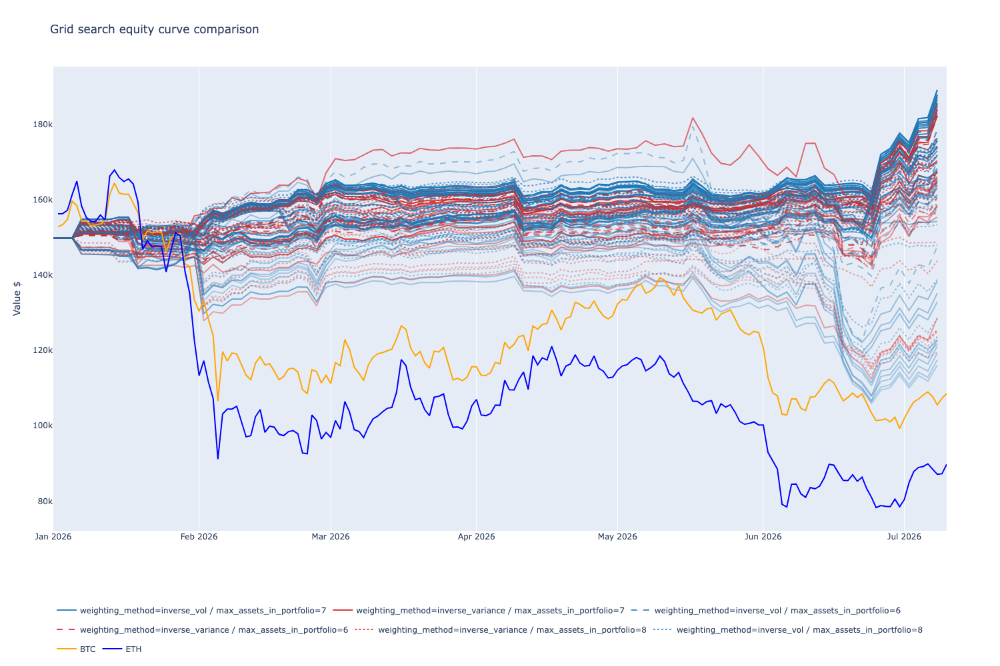

In [13]:
from tradeexecutor.visual.grid_search_basic import visualise_grid_search_equity_curves
from tradeexecutor.analysis.multi_asset_benchmark import get_benchmark_data

# Automatically create BTC and ETH buy and hold benchmark if present
# in the trading universe
benchmark_indexes = get_benchmark_data(
    strategy_universe,
    cumulative_with_initial_cash=Parameters.initial_cash,
    start_at=pd.Timestamp(Parameters.backtest_start),
)

# Extract GridSearchResult instances from optimiser results.
#
# `ignore_wallet_errors=True` turns a crashed backtest into a placeholder GridSearchResult whose
# equity curve is indexed at 1970-01-01/02 (see create_grid_search_failed_result). Those rows are
# not removed by `r.filtered`, which only reflects the MinTradeCountFilter, so leaving them in
# stretches the chart's x axis from 1970 to 2026 and flattens every real curve into a vertical line.
candidates = [r.result for r in optimiser_result.results if not r.filtered]
grid_search_results = [r for r in candidates if r.exception is None]
failed = len(candidates) - len(grid_search_results)
if failed:
    print(f"Excluding {failed} backtest(s) that failed with an exception from the equity curve chart")

fig = visualise_grid_search_equity_curves(
    grid_search_results,
    benchmark_indexes=benchmark_indexes,
    log_y=False,
    # Group by dimensions that actually varied in this search - the NB73 originals are pinned here.
    group_by="weighting_method",
    group_by_secondary="max_assets_in_portfolio",
)
fig.show()

# Parameter analysis

## Decision tree visualisation

Analysing Calmar for parameters: ['cagr_lookback_days', 'cagr_weight', 'gate_threshold', 'inverse_vol_window', 'max_assets_in_portfolio', 'sharpe_lookback_days', 'weighting_method']


/var/folders/12/pbc59svn70q_9dfz1kjl3zww0000gn/T/ipykernel_9692/4048010377.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = le.fit_transform(X[col])


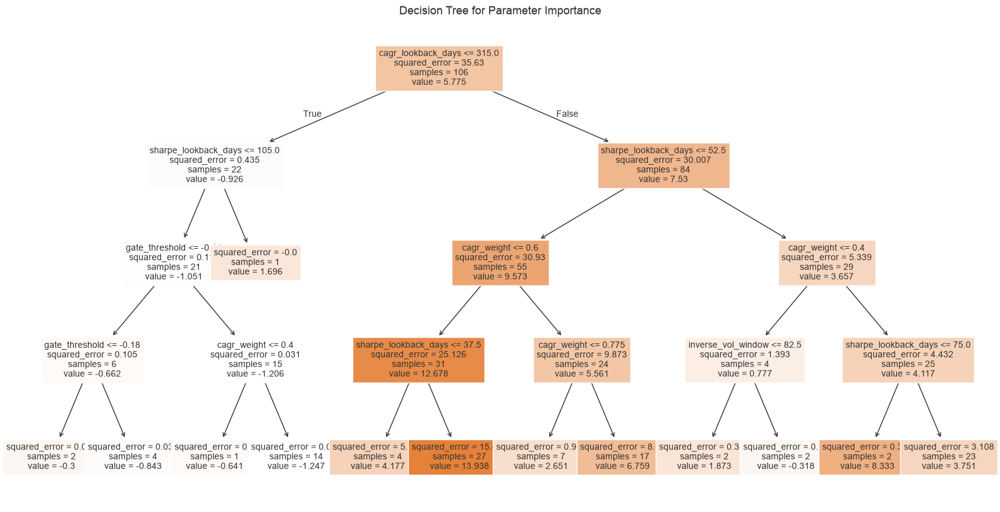

In [14]:
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeRegressor, plot_tree

parameter_names = list(df.index.names)
parameter_df = df
parameter_df = parameter_df.reset_index()

analysis_metric = "Calmar"
print(f"Analysing {analysis_metric} for parameters: {parameter_names}")

# Prepare data
X = parameter_df[parameter_names]
y = parameter_df[analysis_metric]

# Convert categorical values if needed
for col in X.columns:
    if X[col].dtype == 'object':
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])

# Train a simple decision tree
tree = DecisionTreeRegressor(max_depth=4)
tree.fit(X, y)

# Plot
plt.figure(figsize=(20, 10))
plot_tree(tree, feature_names=X.columns, filled=True, fontsize=10)
plt.title('Decision Tree for Parameter Importance')
plt.show()

## Feature importance analysis

Use a regression model to determine which parameters have the strongest influence.



/var/folders/12/pbc59svn70q_9dfz1kjl3zww0000gn/T/ipykernel_9692/785418835.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = le.fit_transform(X[col])


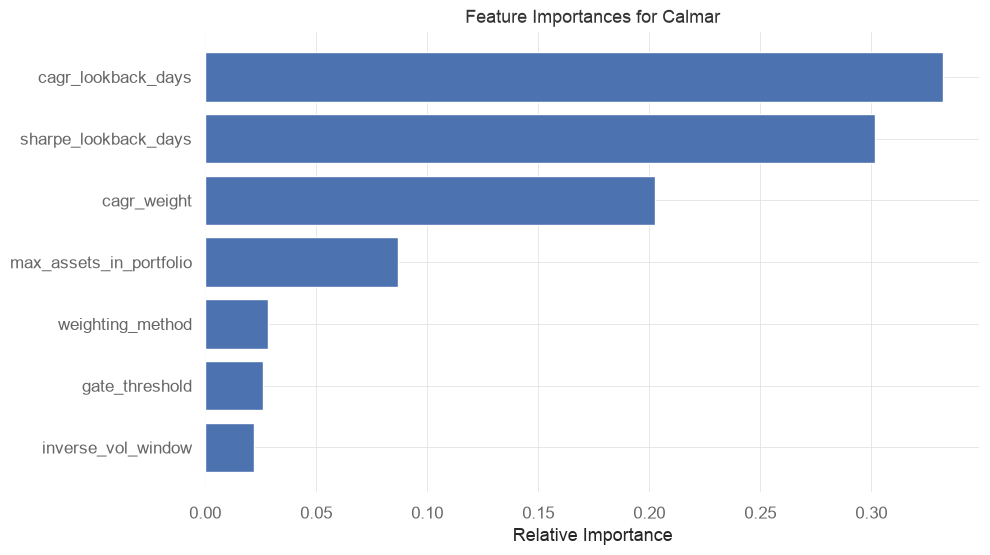

In [15]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
X = parameter_df[parameter_names]
y = parameter_df[analysis_metric]

# Convert categorical values to numeric if needed
for col in X.columns:
    if X[col].dtype == 'object':
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])

# Train a random forest model
model = RandomForestRegressor(n_estimators=100)
model.fit(X, y)

# Plot feature importances
importances = model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 6))
plt.title(f'Feature Importances for {analysis_metric}')
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [X.columns[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## Heatmaps for parameter pairs

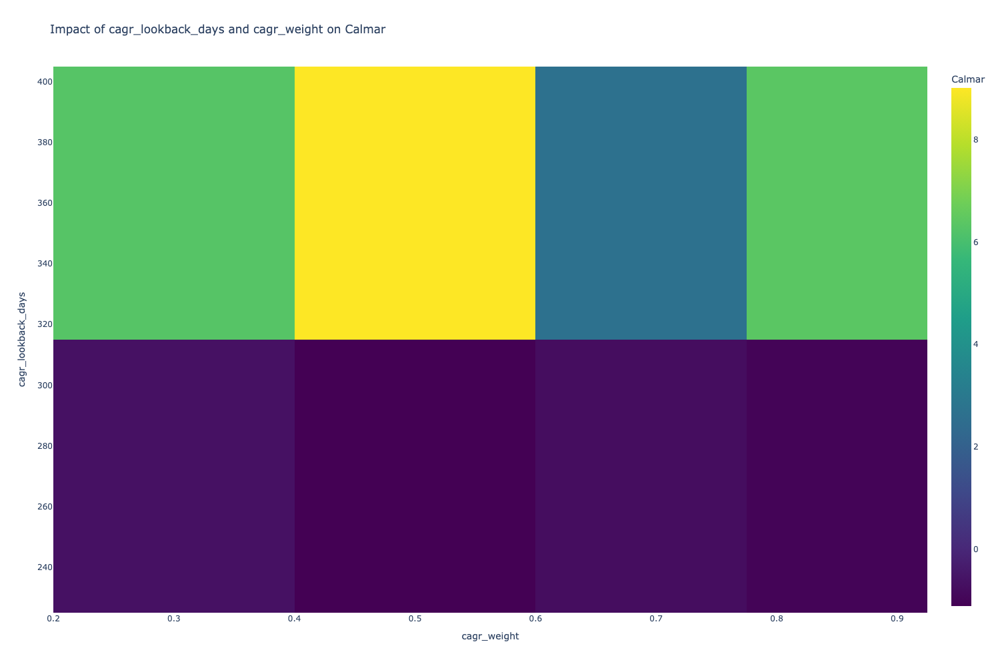

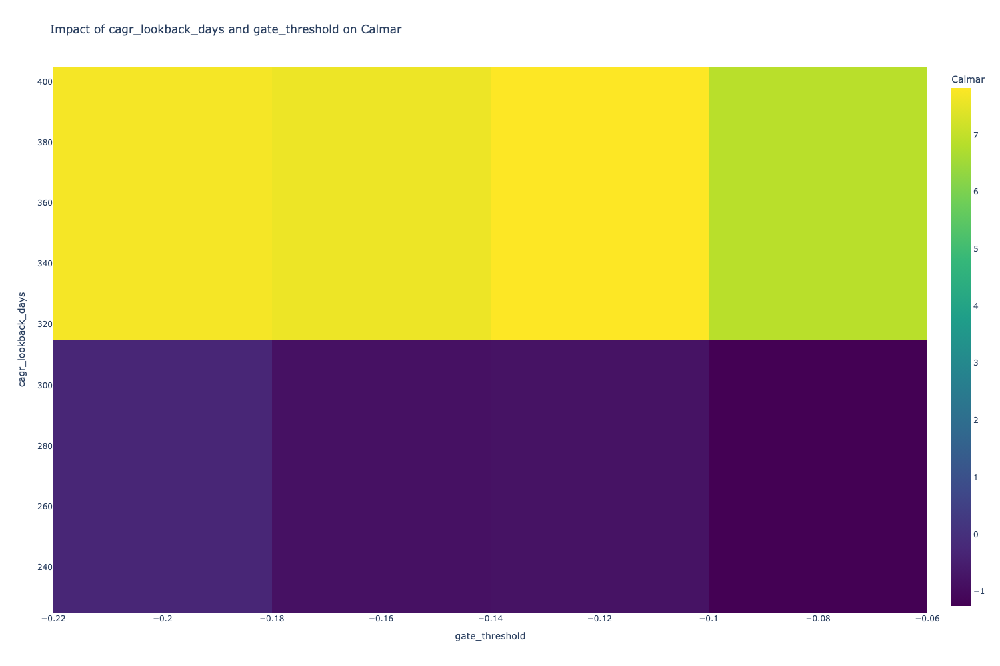

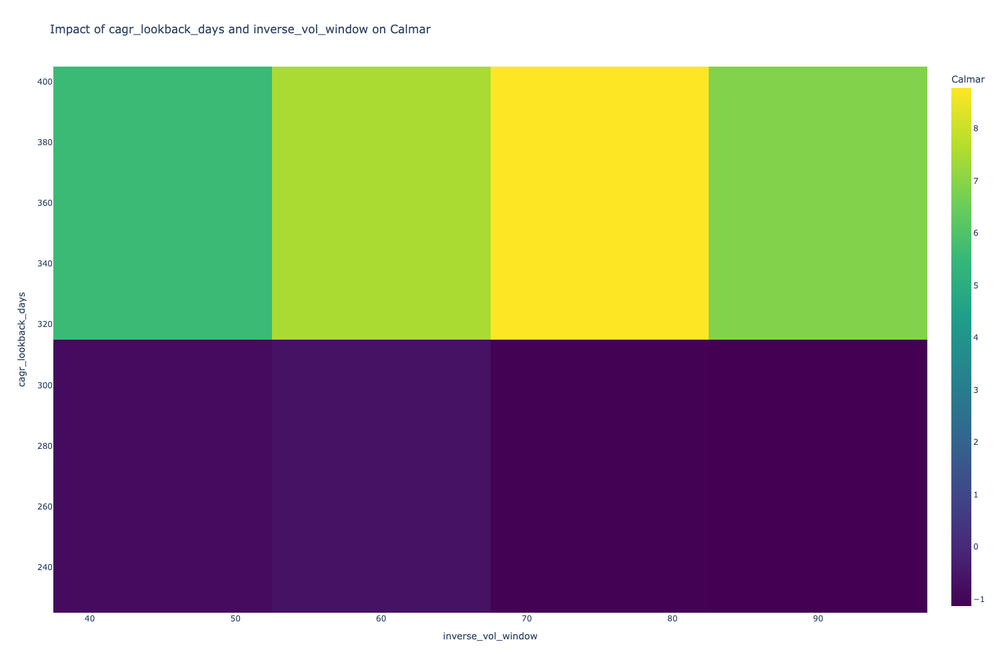

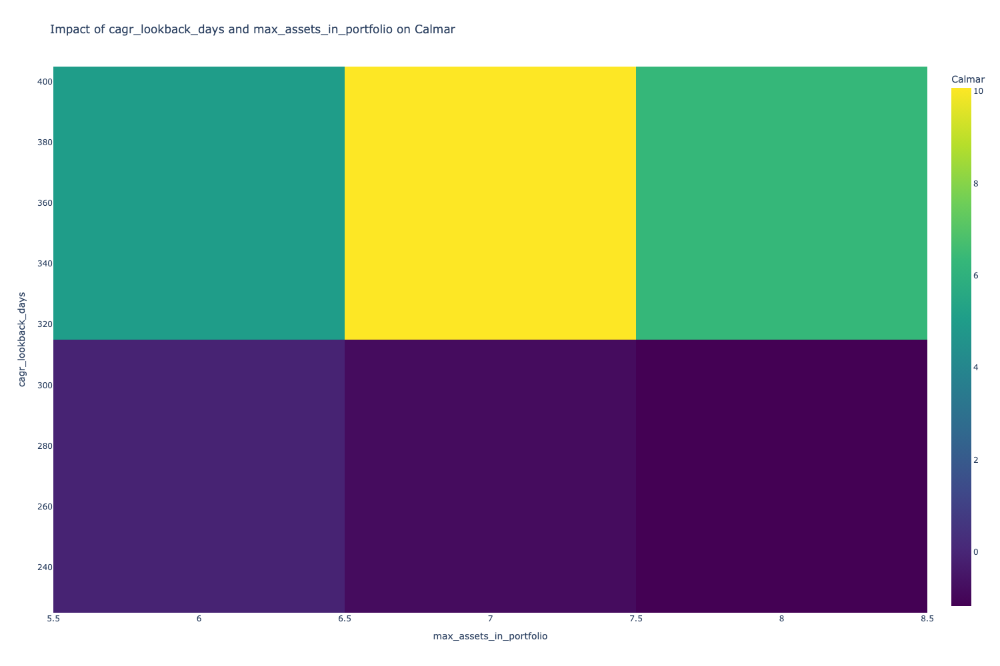

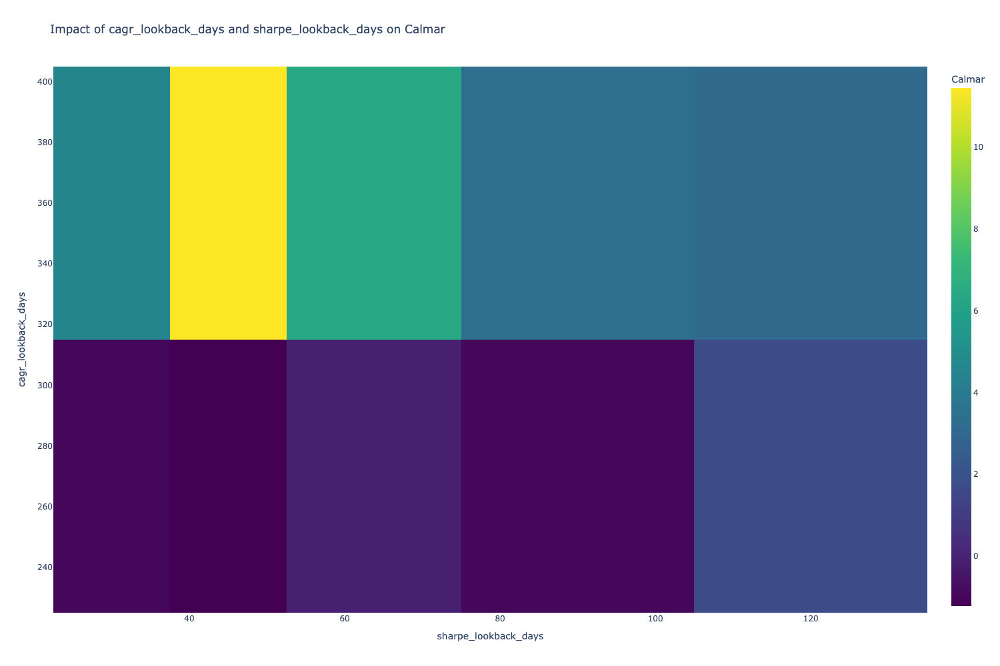

...

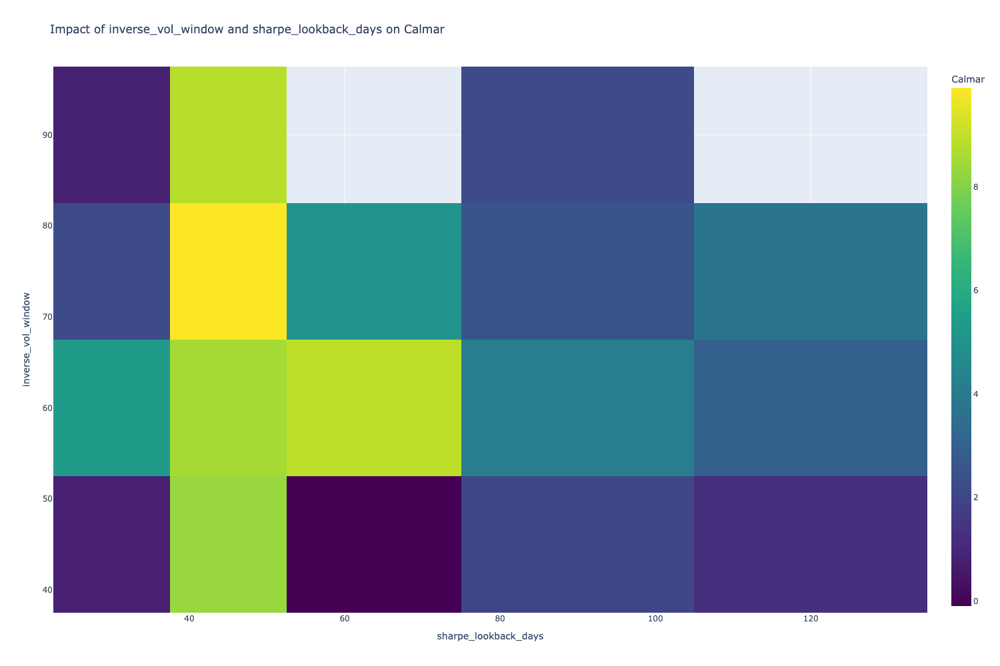

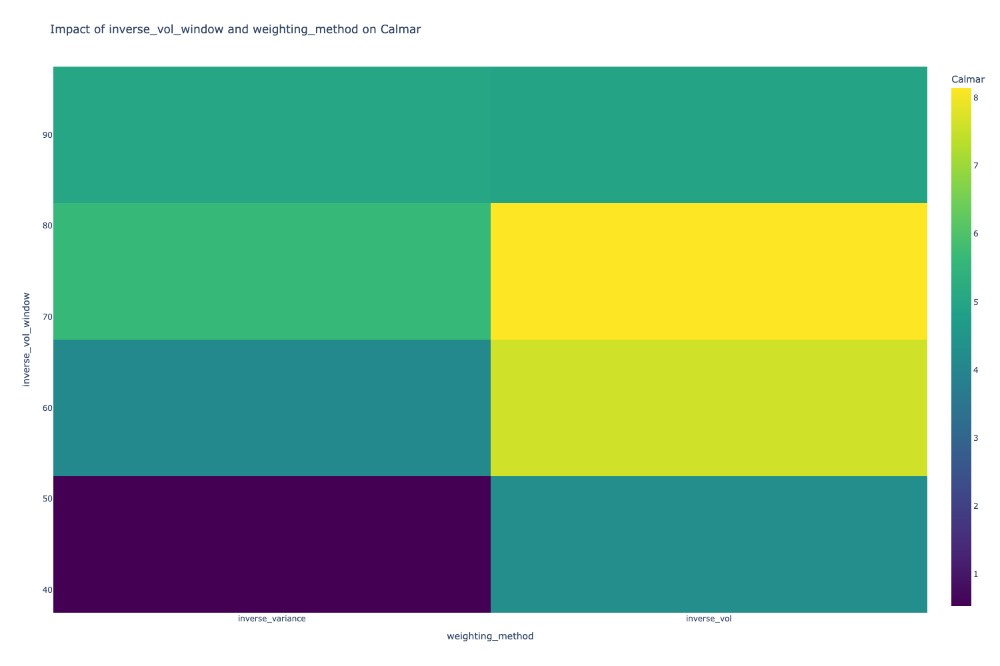

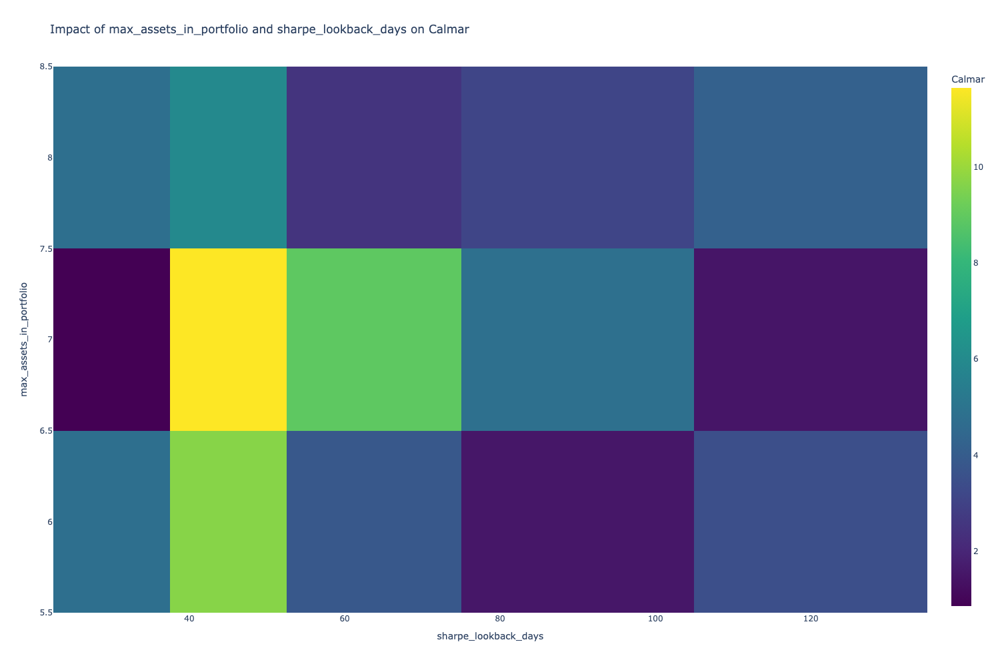

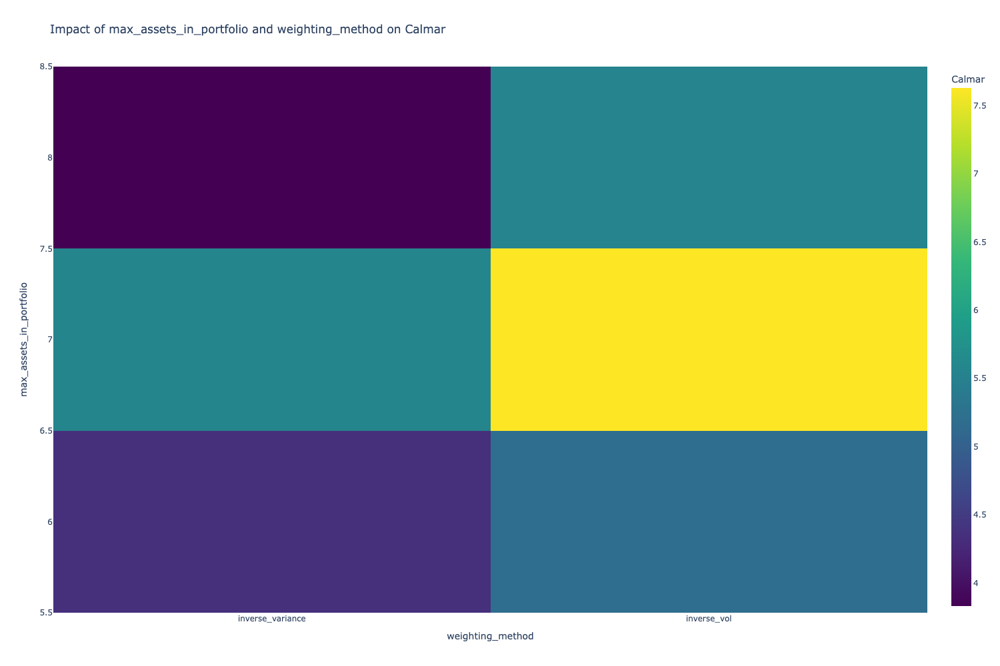

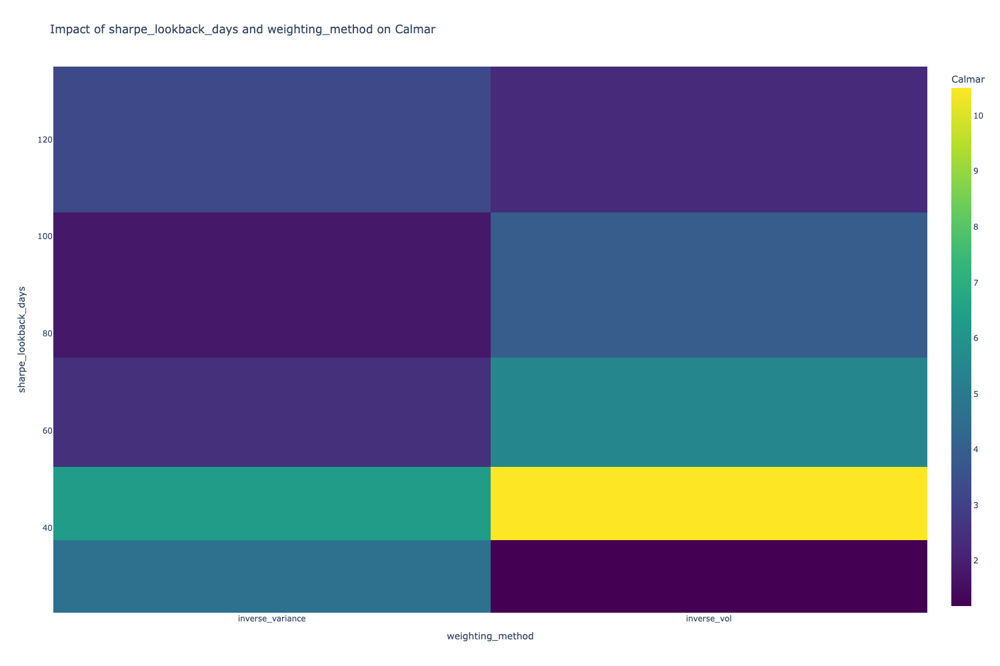

In [16]:
import plotly.graph_objects as go
import numpy as np

def create_heatmap(df, param1, param2, metric):
    # Create pivot table
    pivot = df.pivot_table(
        values=metric, 
        index=param1,
        columns=param2,
        aggfunc="mean"
    )
    
    fig = go.Figure(data=go.Heatmap(
        z=pivot.values,
        x=pivot.columns,
        y=pivot.index,
        colorscale='Viridis',
        colorbar=dict(title=metric)
    ))
    
    fig.update_layout(
        title=f'Impact of {param1} and {param2} on {metric}',
        xaxis_title=param2,
        yaxis_title=param1
    )
    
    return fig

# All parameter pairs, not just consecutive ones - the consecutive-only loop skipped
# hold x softband entirely.
from itertools import combinations

param_pairs = list(combinations(parameter_names, 2))

for param1, param2 in param_pairs:
    fig = create_heatmap(parameter_df, param1, param2, metric=analysis_metric)
    fig.show()

## Cluster analysis

/var/folders/12/pbc59svn70q_9dfz1kjl3zww0000gn/T/ipykernel_9692/3570698548.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col] = le.fit_transform(X[col])


cluster      CAGR                              Sharpe                      \
               mean       min       max count      mean       min       max   
0       0  0.242018  0.072573  0.359691    15  1.775467  0.549300  2.792969   
1       1  0.180624  0.056895  0.278063    15  1.168526  0.633743  1.712764   
2       2  0.346567 -0.024639  0.571239    28  2.079646 -0.216377  3.074210   
3       3 -0.266476 -0.391264 -0.030769    21 -1.043648 -1.517781  0.059989   
4       4  0.282785  0.046386  0.537115    27  1.980428  0.621678  3.054932   

     Max DD                      
       mean       min       max  
0 -0.046840 -0.068311 -0.028610  
1 -0.074450 -0.144929 -0.028304  
2 -0.042617 -0.104446 -0.024668  
3 -0.254276 -0.317490 -0.120562  
4 -0.039415 -0.097434 -0.018492

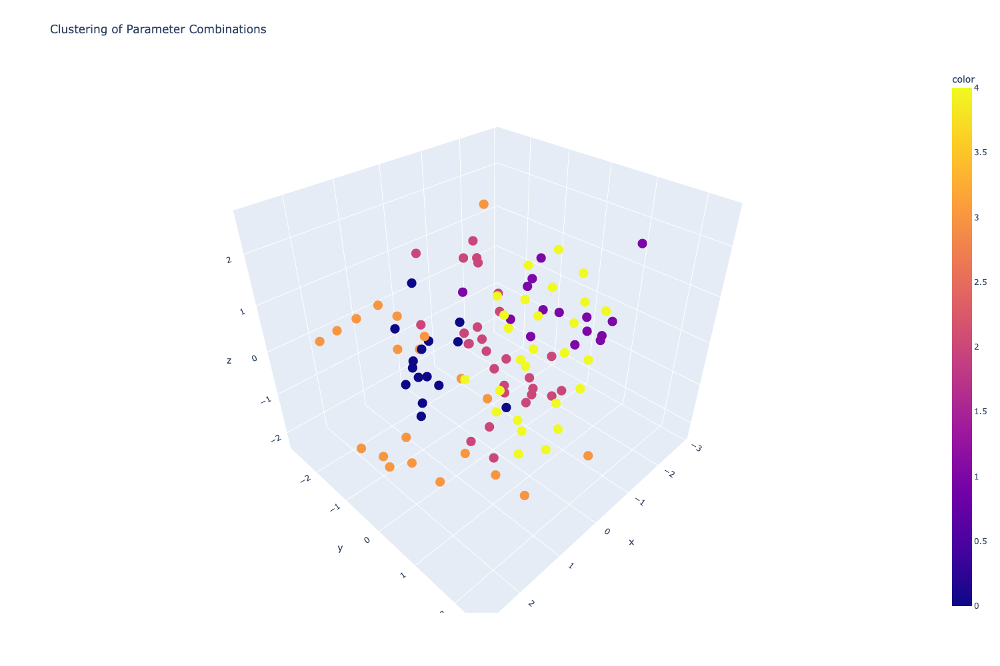

In [17]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import plotly.express as px

# Select features for clustering
features = parameter_names
X = parameter_df[features]

# Convert categorical values to numeric
for col in X.columns:
    if X[col].dtype == 'object':
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-means clustering (determine optimal k separately)
kmeans = KMeans(n_clusters=5, random_state=42)
parameter_df['cluster'] = kmeans.fit_predict(X_scaled)

# Analyze performance by cluster
cluster_perf = parameter_df.groupby('cluster').agg({
    'CAGR': ['mean', 'min', 'max', 'count'],
    'Sharpe': ['mean', 'min', 'max'],
    'Max DD': ['mean', 'min', 'max']
}).reset_index()

display(cluster_perf)

# Visualize clusters in 3D space (using first 3 PCA components)
from sklearn.decomposition import PCA

try:
    pca = PCA(n_components=3)
    components = pca.fit_transform(X_scaled)

    fig = px.scatter_3d(
        x=components[:, 0],
        y=components[:, 1],
        z=components[:, 2],
        color=parameter_df['cluster'],
        hover_data={'Sharpe': parameter_df['Sharpe'], 'CAGR': parameter_df['CAGR']},
        title='Clustering of Parameter Combinations'
    )
    fig.show()
except ValueError as e:
    print(f"Error in PCA: {e}")
    print("PCA failed, possibly due to too few features or singular matrix.")
    # Handle the error as needed

## Parallel coordinates plot

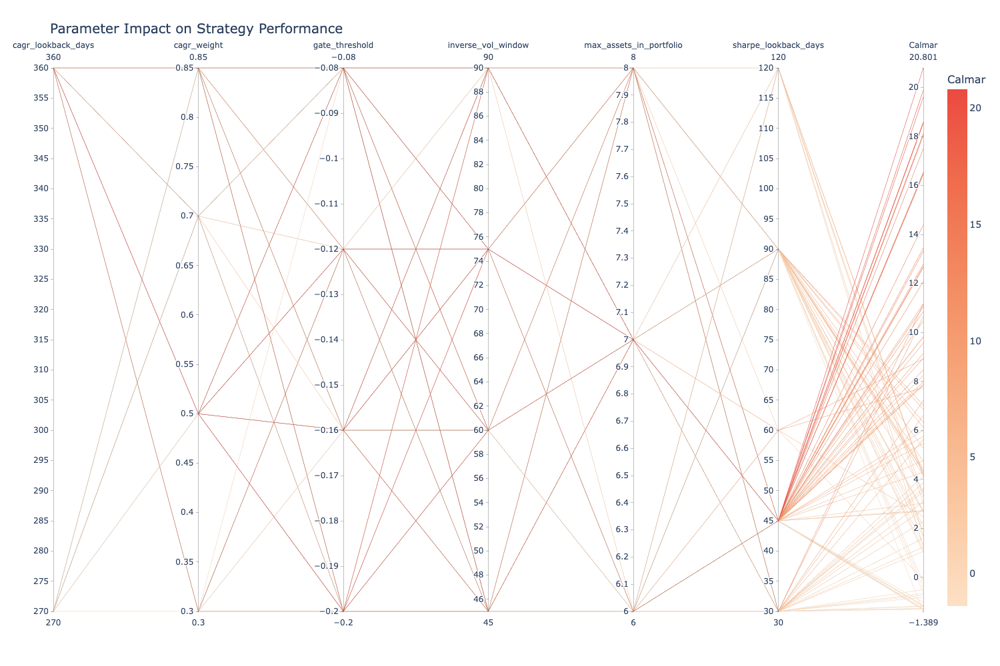

In [18]:
import plotly.express as px

# Extract top results (e.g., top 50)
top_results = parameter_df.head(50)

dimensions = parameter_names + [analysis_metric]

# Create parallel coordinates plot
fig = px.parallel_coordinates(
    parameter_df,
    dimensions=dimensions,
    color=analysis_metric,
    color_continuous_scale=px.colors.sequential.Peach,
    title='Parameter Impact on Strategy Performance'
)


# Increase font size for axis titles, tick labels, and title
fig.update_layout(
    font=dict(size=14),  # Base font size for the whole figure
    title=dict(
        text='Parameter Impact on Strategy Performance',
        font=dict(size=20)  # Title font size
    ),
    coloraxis_colorbar=dict(
        title=dict(
            text=analysis_metric,
            font=dict(size=16)
        ),
        tickfont=dict(size=14)
    )
)

# Parallel coordinates chart: Line width not supported
# https://github.com/plotly/plotly.js/issues/2573

fig.show()

# The best candidate equity curve

The best result found for <function optimise_calmar at 0x12d180510> was <GridSearchResult
  #73, cagr_lookback_days=360, cagr_weight=0.5, gate_threshold=-0.2, inverse_vol_window=75, max_assets_in_portfolio=7, sharpe_lookback_days=45, weighting_method=inverse_vol
  CAGR: 57.00%, Sharpe: 3.07, Sortino: 7.82, Max drawdown:-3.00%
>


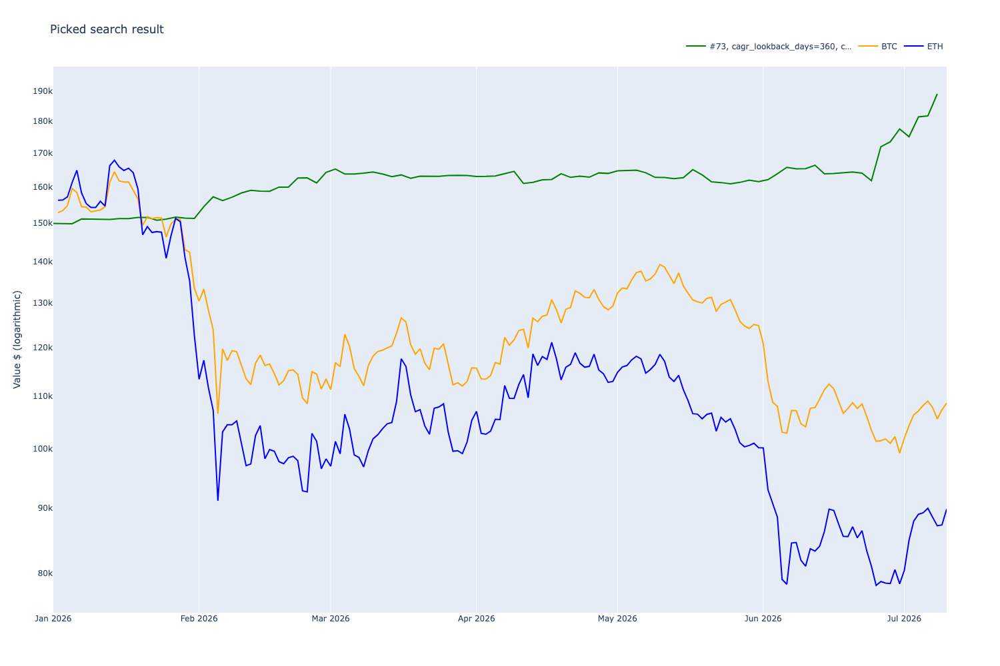

In [19]:
from tradeexecutor.visual.grid_search import visualise_single_grid_search_result_benchmark

# GridSearchResult instance that gave the best performance
best_pick = next(result.result for result in optimiser_result.results if not result.filtered)
state = best_pick.hydrate_state()

print(f"The best result found for {search_func} was {best_pick}")

fig = visualise_single_grid_search_result_benchmark(
    best_pick, 
    strategy_universe, 
    initial_cash=Parameters.initial_cash,
    log_y=True,
)
fig.show()

# Portfolio performance (best pick)

- Compare buy and hold against our best performance

In [20]:
from tradeexecutor.analysis.multi_asset_benchmark import compare_strategy_backtest_to_multiple_assets

returns = best_pick.returns

df = compare_strategy_backtest_to_multiple_assets(
    state=state,
    strategy_universe=strategy_universe,
    returns=returns,
    display=True,
    asset_count=3,
)
display(df)

,Strategy,BTC,ETH
Start Period,2026-01-01,2026-01-01,2026-01-01
End Period,2026-07-08,2026-07-08,2026-07-08
Risk-Free Rate,0.0%,0.0%,0.0%
Time in Market,49.0%,98.0%,98.0%
Cumulative Return,26.17%,-31.79%,-44.56%
CAGR﹪,57.04%,-52.42%,-68.18%
Sharpe,3.07,-1.28,-1.43
Prob. Sharpe Ratio,99.87%,17.96%,15.34%
Smart Sharpe,3.0,-1.25,-1.39
Sortino,7.82,-1.72,-1.93


# Trade summary (best pick)

- Show statistics about the made trades

In [21]:
summary = best_pick.summary
display(summary.to_dataframe())

,0
Trading period length,188 days 0 hours
Trading start,None
Trading end,None
Return %,26.05%
Annualised return %,50.57%
Cash at start,"$150,000.00"
Value at end,"$189,072.63"
Time in market,0.00%
Time in market volatile,0.00%
Trade volume,"$5,011,618.01"


# Trading pair performance breakdown

- Show breakdown of different pairs on the best result

In [22]:
from tradeexecutor.analysis.multipair import analyse_multipair
from tradeexecutor.analysis.multipair import format_multipair_summary

# Zero-duration positions: opened and closed inside the same decision cycle.
#
# `analyse_multipair()` asserts every position has a positive duration, so one of these aborts the
# whole analysis. They are a real artefact of a 2-day cadence, not a reporting nuisance: the
# strategy opened a vault position and unwound it before the next decision point, paying the 10 BPS
# exit fee for no holding period at all. Report them, then run the analysis on what remains.
zero_duration = [
    p for p in state.portfolio.get_all_positions()
    if p.closed_at is not None and p.opened_at is not None and p.closed_at <= p.opened_at
]

if zero_duration:
    print(f"{len(zero_duration)} position(s) opened and closed within one cycle:")
    display(pd.DataFrame([{
        "Vault": p.pair.base.token_symbol,
        "Opened": p.opened_at,
        "Closed": p.closed_at,
        "Realised profit USD": float(p.get_realised_profit_usd() or 0.0),
        "Trades": p.get_trade_count(),
    } for p in zero_duration]).style.format({"Realised profit USD": "${:,.2f}"}).set_caption(
        "Positions with no holding period - they pay the exit fee and cannot earn vault yield"
    ))
    print("These are excluded from the multipair summary below because "
          "analyse_multipair() asserts on them.")

try:
    multipair_summary = analyse_multipair(state)
    display(format_multipair_summary(multipair_summary))
except AssertionError as exc:
    print(f"Multipair summary unavailable: {exc}")
    print("This is the zero-duration position issue above, not a data problem.")


,Trading pair,Positions,Trades,Total return %,Total PnL USD,Best,Worst,Avg,Median,Volume,Wins,Losses,Take profits,Stop losses,Trailing stop losses,Volatility
5,Realist Capital,3,49,43.66%,"23,785.51",42.59%,-2.57%,14.55%,3.63%,"206,816.65",2,1,0,0,0,19.99%
18,songer1993.hl,1,3,26.05%,"1,336.03",26.05%,26.05%,26.05%,26.05%,"11,592.61",1,0,0,0,0,0.00%
10,Didibaba,3,6,17.62%,540.52,27.16%,-7.66%,5.87%,-1.89%,"26,033.29",1,2,0,0,0,15.24%
24,Alphadhad X,1,2,10.05%,340.81,10.05%,10.05%,10.05%,10.05%,"7,124.58",1,0,0,0,0,0.00%
1,Octavious Maximus,3,14,9.98%,984.55,17.85%,-6.11%,3.33%,-1.75%,"27,768.58",1,2,0,0,0,10.42%
0,Goon Edging,5,36,8.47%,"5,056.42",7.28%,-2.06%,1.69%,-1.15%,"184,250.66",2,3,0,0,0,4.18%
23,HBS Bitcoin Volatility Engine,2,4,8.31%,722.47,5.64%,2.67%,4.15%,4.15%,"35,295.30",2,0,0,0,0,1.48%
20,Hyperliquidity Provider (HLP),4,18,6.00%,"2,956.00",6.26%,-0.10%,1.50%,-0.08%,"378,844.73",1,3,0,0,0,2.75%
21,22Cap,5,59,3.66%,"4,600.95",3.44%,-0.13%,0.73%,-0.10%,"607,613.13",2,3,0,0,0,1.38%
13,-VectorZero-,5,16,3.61%,697.75,5.93%,-0.91%,0.72%,-0.59%,"244,983.39",1,4,0,0,0,2.62%


# Best positions

- Find positions that made most profit for the leading backtest

In [23]:
profit_by_position = [(p.get_realised_profit_usd(), p) for p in state.portfolio.get_all_positions()]
profit_by_position.sort(key=lambda t: t[0] or -999_999_999, reverse=True)

data = []

for profit, p in profit_by_position[0:5]:
    data.append({
        "Profit USD": profit,
        "Pair": p.pair.get_ticker(),
        "Position id": p.position_id,
        "Opened": p.opened_at,
        "Closed": p.closed_at,
        "Duration": p.closed_at - p.opened_at if p.closed_at else "(still open)",
        "Open price": p.get_opening_price(),
        "Close price": p.get_closing_price(),
        "Trades": p.get_trade_count(),
        "Price gain %": (p.get_closing_price() - p.get_opening_price()) / p.get_opening_price() * 100,
        "Weight at open %": p.get_capital_tied_at_open_pct() * 100,
    })

df = pd.DataFrame(data)
display(df)

,Profit USD,Pair,Position id,Opened,Closed,Duration,Open price,Close price,Trades,Price gain %,Weight at open %
0,4412.285756,22Cap-USDC,58,2026-04-13,2026-07-06,"84 days, 0:00:00",3.534444,3.903121,37,10.430981,17.582598
1,3070.157032,Hyperliqui-USDC,21,2026-01-23,2026-02-02,"10 days, 0:00:00",2.453729,2.607270,4,6.257443,32.340000
2,2971.433836,pmalt-USDC,23,2026-01-23,2026-05-21,"118 days, 0:00:00",10.693423,11.255627,41,5.257469,7.448957
3,2805.935038,Realist Ca-USDC,88,2026-06-24,NaT,(still open),5.211372,7.763732,6,48.976759,27.638521
4,2286.531758,Realist Ca-USDC,38,2026-03-08,2026-06-02,"86 days, 0:00:00",3.718453,4.116221,38,10.697163,5.526683


# Rolling sharpe

- The rolling sharpe ratio of the best pick

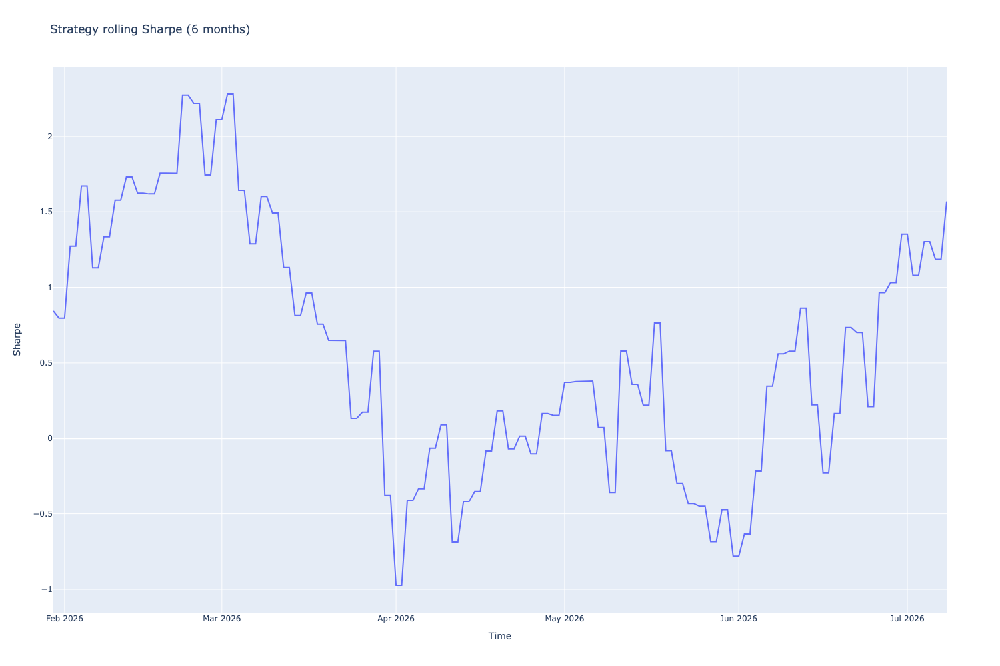

In [24]:
import plotly.express as px

from tradeexecutor.visual.equity_curve import calculate_equity_curve, calculate_returns
from tradeexecutor.visual.equity_curve import calculate_rolling_sharpe

# A 180-day window over a ~190-day backtest leaves ~10 points; 30 days is readable.
rolling_sharpe = calculate_rolling_sharpe(
    returns,
    freq="D",
    periods=30,
)

fig = px.line(rolling_sharpe, title='Strategy rolling Sharpe (6 months)')
fig.update_layout(showlegend=False)
fig.update_yaxes(title="Sharpe")
fig.update_xaxes(title="Time")
fig.show()

# Data diagnosics

- Some example code to track down issues with data


In [25]:
# data = [{"Timestamp": s.calculated_at, "Equity": s.net_asset_value} for s in state.stats.portfolio]
# df = pd.DataFrame(data)
# df = df.set_index("Timestamp")

# with pd.option_context('display.min_rows', 50, "display.max_rows", 50):
#     display(df)

In [26]:
# for t in state.portfolio.get_all_trades():
#     if t.executed_at.date() == datetime.date(2023, 12, 29):
#         print(t, t.pair, t.get_value())

In [27]:
# import plotly.graph_objects as go

# pair_desc = (ChainId.ethereum, "uniswap-v3", "WBTC", "USDC", 0.0005)
# pair = strategy_universe.get_pair_by_human_description(pair_desc)
# df = strategy_universe.data_universe.candles.get_candles_by_pair(pair.internal_id)


# fig = go.Figure(data=go.Ohlc(x=df.timestamp,
#                     open=df.open,
#                     high=df.high,
#                     low=df.low,
#                     close=df.close))
# fig.show()

# with pd.option_context('display.min_rows', 5000, "display.max_rows", 5000, 'display.float_format', lambda x: f'{x:.6f}'):
#     display(df)